<style>
.rtl-fa {
    direction: rtl;
    text-align: right;
}
.rtl-fa ul, .rtl-fa ol {
    padding-right: 2em;
    padding-left: 0;
}
.rtl-fa blockquote {
    border-left: none !important;
    border-right: 4px solid #dfe2e5;
    padding-left: 0 !important;
    padding-right: 1em;
    margin-left: 0;
    margin-right: 0;
}
.rtl-fa table {
    direction: rtl;
    margin-left: auto;
    margin-right: 0;
}
.rtl-fa th, .rtl-fa td {
    text-align: right !important;
}
.rtl-fa code, .rtl-fa pre, .rtl-fa kbd, .rtl-fa samp,
.rtl-fa .MathJax, .rtl-fa mjx-container {
    direction: ltr !important;
    unicode-bidi: isolate;
}
.rtl-fa pre {
    text-align: left !important;
}
</style>

<div class="rtl-fa" dir="rtl" style="text-align: right;">

# هفته ۱۱ — تکلیف: فراتر از تمرین کلاسی

> **سؤال اصلی:** در تمرین کلاسی دیدیم که روی یک دیتاست کوچک و ساده، استفاده از ویژگی‌های ازپیش‌آموزش‌دیده و فریزکردن backbone بهتر از آموزش مدل از صفر جواب می‌دهد. آیا وقتی دیتاست واقعاً سخت‌تر شود، این روش هنوز هم خوب کار می‌کند؟ و اگر «فقط backbone را فریز کن» کافی نبود، قدم بعدی چیست؟

## مرور کلی تکلیف

- **زمان پیشنهادی:** حدود ۶ تا ۸ ساعت؛ می‌توانید در طول هفته هرطور که برایتان مناسب است تقسیمش کنید.
- — دیتاست جدید، مقاله‌های جدید و چند قابلیت جدید در PyTorch دارید که قبلاً استفاده نکرده‌اید (مثل parameter groups، hookها و ترکیب دستی batchها). هیچ بخشی از این تکلیف صرفاً با کپی‌کردن بدون تغییرِ کدهای تمرین کلاسی حل نمی‌شود.
- **دیتاست جدید:** **Oxford-IIIT Pet Dataset** — شامل ۳۷ نژاد حیوان خانگی با عکس‌های واقعی و در دسترس از طریق `torchvision.datasets.OxfordIIITPet`. این مسئله واقعاً از زیرمجموعه‌ی ۴کلاسه‌ی CIFAR-10 در تمرین کلاسی سخت‌تر است: دسته‌بندی ریزدانه است (مثلاً Bombay cat و Russian Blue خیلی شبیه هم‌اند) و دیگر با یک مسئله‌ی اسباب‌بازی طرف نیستیم.
- **مقاله‌های جدید:** سه مطالعه‌ی کوتاه و هدفمند؛ برای هرکدام فقط باید به **بخش‌ها یا معادله‌های مشخص‌شده** مراجعه کنید، نه کل مقاله:
  1. Yosinski, Clune, Bengio, Lipson — *"How transferable are features in deep neural networks?"* (NeurIPS 2014).
     [arXiv:1411.1792](https://arxiv.org/abs/1411.1792)
  2. Selvaraju et al. — *"Grad-CAM: Visual Explanations from Deep Networks via Gradient-based Localization"* (ICCV 2017).
     [arXiv:1610.02391](https://arxiv.org/abs/1610.02391)
  3. Zhang, Cissé, Dauphin, Lopez-Paz — *"mixup: Beyond Empirical Risk Minimization"* (ICLR 2018).
     [arXiv:1710.09412](https://arxiv.org/abs/1710.09412)

## چه چیزهایی در این تکلیف واقعاً جدید است؟

| مهارت | تمرین کلاسی | این تکلیف |
|---|---|---|
| روش Transfer Learning | فقط backbone فریز بود | **Fine-tuning** — بازکردن انتخابی بعضی لایه‌ها برای آموزش |
| تنظیم Optimizer | یک learning rate برای همه‌چیز | **Parameter groups** — learning rateهای متفاوت برای بخش‌های مختلف مدل |
| درک رفتار مدل | بررسی shapeها و شمارش پارامترها | **Grad-CAM** — دیدن اینکه مدل برای تصمیم‌گیری به *کجای تصویر* نگاه می‌کند |
| Augmentation | فقط تبدیل‌های هندسی/رنگی | **mixup** — ترکیب دو تصویر و برچسب‌هایشان |
| دیتاست | زیرمجموعه‌ی ۴کلاسه‌ی CIFAR-10 (دسته‌های کلی) | عکس‌های واقعی با ۳۷ کلاس (دسته‌بندی ریزدانه) |

## مواردی که باید تحویل دهید

- [ ] یک نوت‌بوک کامل که تمام سلول‌های `# TODO` در آن تکمیل شده و قابل اجرا باشد
- [ ] پاسخ همه‌ی سؤال‌های نوشتاری با بیان خودتان
- [ ] **گزارش تأمل/جمع‌بندی نهایی** در بخش ۶ — یک جمع‌بندی کوتاه نوشتاری، نه فقط خروجی کد

شروع کنیم.

</div>


<div class="rtl-fa" dir="rtl" style="text-align: right;">

---
# بخش ۰ — : PetScan (حدود ۲۰ دقیقه)

PixelWorks AI (بله، همان تیم تمرین کلاسی) یک مشتری جدید گرفته است: **PetScan**؛ استارتاپی که می‌خواهد اپی بسازد تا از روی عکس موبایل، نژاد حیوان خانگی را تشخیص دهد. برخلاف SnapSort که فقط چهار دسته‌ی کلی داشت (گربه، سگ، ماشین، کشتی)، PetScan باید **۳۷ نژاد مشخص** را تشخیص دهد؛ بعضی از این نژادها از نظر ظاهری تقریباً شبیه هم‌اند. حرف مدیرتان دقیقاً این است:
*«دفعه‌ی قبل ویژگی‌های فریز‌شده‌ی ResNet18 خیلی خوب جواب داد؛ اول همان را امتحان کن، ولی تعجب نکن اگر این بار کافی نباشد.»*

</div>


In [1]:
from copy import deepcopy
from pathlib import Path
import random
import time
from tqdm import tqdm
from tqdm.contrib import tqdm as tqdm_contrib
import time

import matplotlib.pyplot as plt
import numpy as np
import torch
from torch import nn
from torch.utils.data import DataLoader, Dataset, random_split
from torchvision import transforms
from torchvision.datasets import OxfordIIITPet
from torchvision.models import resnet18, ResNet18_Weights
import torchmetrics # This library is imported to calculate metrics. It was not in HW primary file

SEED = 42
DATA_ROOT = Path("data")


def set_seed(seed=SEED):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)


set_seed()
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]
print(f"Using device: {DEVICE}")

Using device: cuda


<div class="rtl-fa" dir="rtl" style="text-align: right;">

## این بار pipeline را خودتان بسازید

در تمرین کلاسی، `TransformSubset`، `make_balanced_indices` و `make_val_test_split` به‌صورت کامل در اختیار شما بود. این بار باید خودتان آن‌ها را با دیتاست جدید سازگار کنید. رابط `OxfordIIITPet` کمی با `CIFAR10` فرق دارد: فقط splitهای `"trainval"` و `"test"` را دارد و برچسب‌ها را به‌جای `.targets` در `._labels` نگه می‌دارد.

**TODO:** هر دو split دیتاست را بارگذاری کنید، اما فعلاً هیچ transformای اعمال نکنید؛ درست مثل الگوی تمرین کلاسی، transformها را بعد از ساخت subset اضافه می‌کنیم. سپس تعداد کل تصاویر و تعداد کلاس‌ها را چاپ کنید.

</div>


In [2]:
raw_trainval = OxfordIIITPet(root=DATA_ROOT, split="trainval", download=True, transform=None)
raw_test_full = OxfordIIITPet(root=DATA_ROOT, split="test", download=True, transform=None)

# TODO: print the number of classes (raw_trainval.classes) and a few class names
# TODO: print len(raw_trainval), len(raw_test_full)

In [3]:
print(f"The Number of Classes = {len(raw_trainval.classes)}")
print(f"The Number of Training/Validation Instances = {len(raw_trainval)}")
print(f"The Number of Test Instances = {len(raw_test_full)}")

The Number of Classes = 37
The Number of Training/Validation Instances = 3680
The Number of Test Instances = 3669


In [4]:
print("Dataset's class names ...")
for i, name in enumerate(raw_trainval.classes):
    print(f"[{i}]: {name}")

Dataset's class names ...
[0]: Abyssinian
[1]: American Bulldog
[2]: American Pit Bull Terrier
[3]: Basset Hound
[4]: Beagle
[5]: Bengal
[6]: Birman
[7]: Bombay
[8]: Boxer
[9]: British Shorthair
[10]: Chihuahua
[11]: Egyptian Mau
[12]: English Cocker Spaniel
[13]: English Setter
[14]: German Shorthaired
[15]: Great Pyrenees
[16]: Havanese
[17]: Japanese Chin
[18]: Keeshond
[19]: Leonberger
[20]: Maine Coon
[21]: Miniature Pinscher
[22]: Newfoundland
[23]: Persian
[24]: Pomeranian
[25]: Pug
[26]: Ragdoll
[27]: Russian Blue
[28]: Saint Bernard
[29]: Samoyed
[30]: Scottish Terrier
[31]: Shiba Inu
[32]: Siamese
[33]: Sphynx
[34]: Staffordshire Bull Terrier
[35]: Wheaten Terrier
[36]: Yorkshire Terrier


<div class="rtl-fa" dir="rtl" style="text-align: right;">

**TODO:** برای اینکه زمان آموزش روی لپ‌تاپ معقول بماند، با یک subset کار کنید:
برای آموزش **۲۰ تصویر از هر نژاد** و برای validation **۸ تصویر از هر نژاد** انتخاب کنید. یعنی ۳۷ × ۲۰ = ۷۴۰ تصویر آموزشی. این تمرین هم تعداد کلاس بیشتری دارد و هم تعداد کل تصاویرش از تنظیم ۴کلاسه و ۲۴۰تصویری تمرین کلاسی بیشتر است، پس انتظار نداشته باشید سرعت اجرا مثل قبل باشد.

تابع `make_balanced_indices` را برای نحوه‌ی ذخیره‌ی برچسب‌ها در این دیتاست سازگار کنید. `raw_trainval._labels` یک لیست معمولی Python از اعداد صحیح است که از قبل از ۰ شروع شده‌اند؛ بنابراین برخلاف زیرمجموعه‌ی CIFAR-10 در تمرین کلاسی، اینجا به `label_map` نیاز ندارید.

</div>


In [5]:
def make_balanced_indices(targets, n_per_class, seed=SEED):
    '''Return a shuffled list of indices with exactly n_per_class examples
    per class in class_ids.'''
    chosens = {}
    for idx, target in enumerate(targets):
        if target not in chosens:
            chosens[target] = []
        
        if len(chosens[target]) < n_per_class:
            chosens[target].append(idx)
        # If already have n_per_class, skip this index

    indices = []
    for values in chosens.values():
        indices.extend(values)
    rng = random.Random(seed)
    rng.shuffle(indices)
    return indices


train_indices = make_balanced_indices(raw_trainval._labels, n_per_class=20, seed=SEED)
val_indices =   make_balanced_indices(raw_test_full._labels, n_per_class=8, seed=SEED)

class_names = raw_trainval.classes
NUM_CLASSES = len(class_names)
print("Classes:", NUM_CLASSES)
print("Train images:", len(train_indices), "| Val images:", len(val_indices))

Classes: 37
Train images: 740 | Val images: 296


<div class="rtl-fa" dir="rtl" style="text-align: right;">

**TODO:** یک کلاس `TransformSubset` بسازید؛ همان ایده‌ی تمرین کلاسی: یک `Dataset` که دیتاست پایه، فهرست indexها و یک transform را نگه می‌دارد. اینجا به `label_map` نیازی نیست، چون برچسب‌های `OxfordIIITPet` از قبل اعداد پیوسته‌ی ۰ تا ۳۶ هستند.

</div>


In [6]:
class TransformSubset(Dataset):
    def __init__(self, base_dataset, indices, transform):
        self.base_dataset = base_dataset
        self.indices = indices
        self.transform = transform

    def __len__(self):
        return len(self.indices)

    def __getitem__(self, idx):
        if idx >= len(self):
            raise IndexError(f"Index {idx} out of range for TransformSubset with length {len(self)}")
        # Get the image and label from the base dataset using the mapped index
        image, label = self.base_dataset[self.indices[idx]]
        
        # Apply transform if provided
        if self.transform:
            image = self.transform(image)
        
        return image, label
        


deterministic_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

train_dataset = TransformSubset(raw_trainval, train_indices, deterministic_transform)
val_dataset = TransformSubset(raw_test_full, val_indices, deterministic_transform)

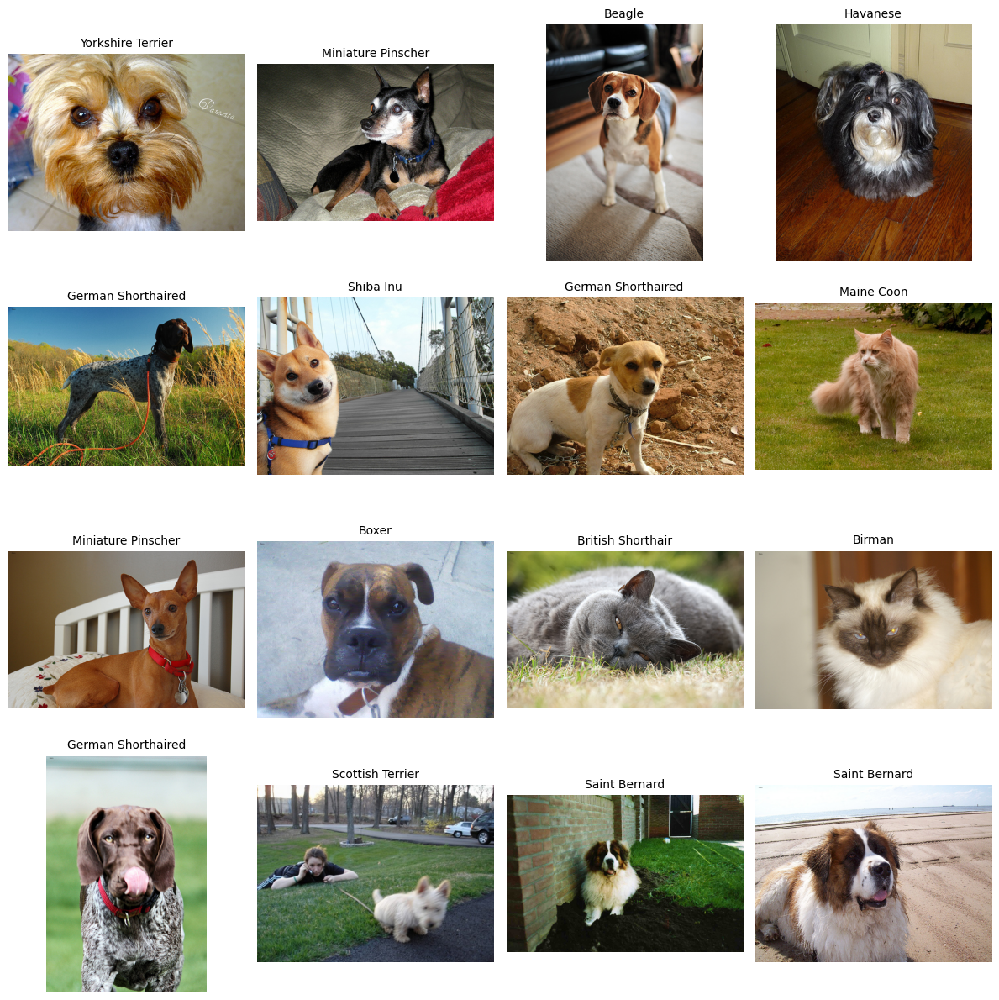

In [7]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

train_dataset = TransformSubset(raw_trainval, train_indices, None)

def plot_image_grid(dataset, class_names, n_rows=4, n_cols=4):
    """
    Plot a grid of images with their labels from the dataset.
    """
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 12))
    axes = axes.flatten()
    
    # Randomly select indices to display
    total_samples = len(dataset)
    if total_samples < n_rows * n_cols:
        selected_indices = list(range(total_samples))
        # Repeat if not enough samples
        selected_indices = selected_indices * (n_rows * n_cols // total_samples + 1)
        selected_indices = selected_indices[:n_rows * n_cols]
    else:
        selected_indices = np.random.choice(total_samples, n_rows * n_cols, replace=False)
    
    for idx, ax in enumerate(axes):
        if idx < len(selected_indices):
            # Get image and label
            image, label = dataset[selected_indices[idx]]
            
            # Display image
            if isinstance(image, Image.Image):
                ax.imshow(image)
            else:
                # If image is a tensor or numpy array
                ax.imshow(image)
            
            # Set title with label
            if class_names and label < len(class_names):
                title = f"{class_names[label]}"
            else:
                title = f"Label: {label}"
            
            ax.set_title(title, fontsize=10)
            ax.axis('off')
        else:
            ax.axis('off')
    
    plt.tight_layout()
    plt.show()

# Plot the grid
plot_image_grid(train_dataset, raw_trainval.classes, n_rows=4, n_cols=4)

<div class="rtl-fa" dir="rtl" style="text-align: right;">

**Q0.1 (قبل از آموزش خوب نگاه کنید):** یک شبکه‌ی `4×4` از تصاویر خام و بدون transformِ داده‌های آموزشی نمایش دهید و نام نژاد هر تصویر را به‌عنوان عنوان بنویسید. واقعاً چند جفت را با دقت نگاه کنید: آیا *خودتان* فقط از روی عکس می‌توانید دو نژاد ظاهراً شبیه را از هم تشخیص دهید؟ مثلاً دو گربه با الگوی راه‌راه مشابه یا دو نژاد تریر که شبیه هم‌اند. یک جفت نژاد از نمونه‌ی خودتان نام ببرید که تشخیصشان برایتان واقعاً سخت بود؛ یا اگر در این ۱۶ تصویر چنین جفتی پیدا نکردید، توضیح دهید چرا.

> **پاسخ شما:**
نه. تشخیص گونه‌های زیر برای من دشوار است. <br/>
Staffordshire Bull Terrier and American Pit Bull Terrier
Ragdoll and Siamese
</div>


<div class="rtl-fa" dir="rtl" style="text-align: right;">

---
# بخش ۱ — روشی که دفعه‌ی قبل جواب داد (حدود ۲۰ دقیقه؛ عمداً کوتاه)

قبل از اینکه سراغ روش جدیدی بروید، روش تمرین کلاسی را به‌عنوان baseline تأیید کنید: ResNet18 ازپیش‌آموزش‌دیده را بارگذاری کنید، backbone را فریز کنید، head را عوض کنید و فقط head را آموزش دهید. این کار را قبلاً انجام داده‌اید، پس این بخش عمداً کوتاه است؛ بخش جالب از قسمت ۲ شروع می‌شود.

</div>


In [8]:
def make_loader(dataset, shuffle, batch_size=16, seed=SEED):
    generator = torch.Generator().manual_seed(seed)
    return DataLoader(dataset, batch_size=batch_size, shuffle=shuffle, num_workers=0, generator=generator)

# Eval function is separated from train function.
# So each function is gonna have unique task
from tqdm import tqdm
import torch

def evaluate_tm(model, data_loader, metric, device='cuda', desc=None):
    model.eval()
    metric.reset()
    
    if desc is None:
        desc = "Validating"
    
    # Create progress bar for evaluation
    eval_pbar = tqdm(data_loader, 
                     desc=desc,
                     leave=False,  # Remove after completion
                     unit="batch",
                     dynamic_ncols=True)
    
    with torch.no_grad():
        for batch_idx, (X_batch, y_batch) in enumerate(eval_pbar):
            X_batch, y_batch = X_batch.to(device), y_batch.to(device)
            y_pred = model(X_batch)
            metric.update(y_pred, y_batch)
            
            # Show current metric
            current_metric = metric.compute().item()
            eval_pbar.set_postfix({'metric': f'{current_metric:.2%}'})
    
    return metric.compute()

from tqdm import tqdm
import torch

def train(model, optimizer, loss_fn, metric, train_loader, valid_loader,
          n_epochs, patience=2, factor=0.5, epoch_callback=None, device='cuda'):
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode="max", patience=patience, factor=factor)
    history = {"train_losses": [], "train_metrics": [], "valid_metrics": []}
    
    for epoch in range(n_epochs):
        total_loss = 0.0
        metric.reset()
        model.train()
        
        if epoch_callback is not None:
            epoch_callback(model, epoch)
        
        # Create progress bar for this epoch
        train_pbar = tqdm(train_loader, 
                         desc=f"Epoch {epoch+1}/{n_epochs} [Train]",
                         leave=True,  # Keep the bar after completion
                         unit="batch",
                         dynamic_ncols=True)  # Adapt to terminal width
        
        for batch_idx, (X_batch, y_batch) in enumerate(train_pbar):
            X_batch, y_batch = X_batch.to(device), y_batch.to(device)
            y_pred = model(X_batch)
            loss = loss_fn(y_pred, y_batch)
            total_loss += loss.item()
            
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()
            metric.update(y_pred, y_batch)
            train_metric = metric.compute().item()
            
            # Update progress bar with current metrics (only once per batch)
            avg_loss = total_loss / (batch_idx + 1)
            train_pbar.set_postfix({
                'loss': f'{avg_loss:.4f}',
                'metric': f'{train_metric:.2%}'
            })
        
        # Calculate epoch averages
        avg_train_loss = total_loss / len(train_loader)
        avg_train_metric = train_metric
        
        history["train_losses"].append(avg_train_loss)
        history["train_metrics"].append(avg_train_metric)
        
        # Validation
        val_metric = evaluate_tm(model, valid_loader, metric, device=device)
        history["valid_metrics"].append(val_metric)
        scheduler.step(val_metric)
        
        # Print epoch summary (clear line and print)
        print(f"\nEpoch {epoch+1}/{n_epochs} - "
              f"Train Loss: {avg_train_loss:.4f}, "
              f"Train Metric: {avg_train_metric:.2%}, "
              f"Valid Metric: {val_metric:.2%}, "
              f"LR: {optimizer.param_groups[0]['lr']:.2e}\n")
    
    return history

def freeze_layers(model, layer_names=None, unfreeze=True):
    """
    Freeze or unfreeze specific layers by name.
    
    Args:
        model: PyTorch model
        layer_names: List of layer names to freeze/unfreeze (if None, freeze all)
        unfreeze: If True, unfreeze specified layers; if False, freeze them
    """
    if layer_names is None:
        # Freeze/unfreeze all layers
        for param in model.parameters():
            param.requires_grad = unfreeze
        if unfreeze:
            model.train()
        else:
            model.eval()
        return
    
    for name, param in model.named_parameters():
        # Check if parameter belongs to specified layers
        is_target = any(layer_name in name for layer_name in layer_names)
        if is_target:
            param.requires_grad = unfreeze
        else:
            param.requires_grad = not unfreeze
    
    # Set model mode
    if unfreeze:
        model.train()
    else:
        model.eval()

def print_trainable_params(model):
    """
    Print which parameters are trainable.
    """
    trainable_count = 0
    total_count = 0
    
    print("Trainable parameters:")
    for name, param in model.named_parameters():
        total_count += param.numel()
        if param.requires_grad:
            trainable_count += param.numel()
            print(f"  ✓ {name}: {param.numel():,} params")
        else:
            print(f"  ✗ {name}: {param.numel():,} params (frozen)")
    
    print(f"\nTotal parameters: {total_count:,}")
    print(f"Trainable parameters: {trainable_count:,} ({100*trainable_count/total_count:.1f}%)")

def run_epoch(model, loader, loss_fn, optimizer=None):
    is_training = optimizer is not None
    model.eval()
    if is_training:
        # Only the parts of the model actually being trained go into train() mode.
        # Which parts that is will change across this homework -- more on that soon.
        for module in model.trainable_modules:
            module.train()

    total_loss, total_correct, total_examples = 0.0, 0, 0
    with torch.set_grad_enabled(is_training):
        for images, labels in loader:
            images, labels = images.to(DEVICE), labels.to(DEVICE)
            logits = model(images)
            loss = loss_fn(logits, labels)
            if is_training:
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()
            batch_size = labels.size(0)
            total_loss += loss.item() * batch_size
            total_correct += (logits.argmax(dim=1) == labels).sum().item()
            total_examples += batch_size

    return {"loss": total_loss / total_examples, "accuracy": total_correct / total_examples}

<div class="rtl-fa" dir="rtl" style="text-align: right;">

به `model.trainable_modules` در بالا توجه کنید؛ این یک bookkeeping کوچک است که در کل این تکلیف به آن نیاز خواهید داشت. در تمرین کلاسی بخش قابل‌آموزش همیشه «فقط head» بود، اما اینجا چنین نیست.

**TODO:** baseline فریز‌شده را بسازید: وزن‌های pretrained را بارگذاری کنید، همه‌چیز را فریز کنید، head را جایگزین کنید و مقدار `feature_model.trainable_modules = [feature_model.fc]` را تنظیم کنید تا `run_epoch` بداند فقط head باید وارد حالت `.train()` شود.

</div>


In [9]:
NUM_CLASSES

37

In [15]:
weights = ResNet18_Weights.DEFAULT

feature_model = resnet18(weights=weights)
# freeze every parameter
freeze_layers(feature_model, layer_names=None, unfreeze=False)
print("Trainable modules after freezing all layers")
print_trainable_params(feature_model)
# TODO: replace feature_model.fc with a fresh nn.Linear(..., NUM_CLASSES)
num_features = feature_model.fc.in_features
feature_model.fc = nn.Linear(num_features, NUM_CLASSES)
feature_model = feature_model.to(DEVICE)
feature_model.trainable_modules = [feature_model.fc]
print("Trainable modules after adding new fc to the model")
print_trainable_params(feature_model)
train_transform = transforms.Compose([
    transforms.RandomResizedCrop(size=(224, 224), scale=(0.8, 1.0)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

train_dataset_aug = TransformSubset(raw_trainval, train_indices, train_transform)
train_loader = make_loader(train_dataset_aug, shuffle=True)
valid_loader = make_loader(val_dataset, shuffle=False)

optimizer = torch.optim.Adam(feature_model.fc.parameters(), lr=1e-3)
loss_fn = nn.CrossEntropyLoss()
metric = torchmetrics.Accuracy(task="multiclass",
                                 num_classes=NUM_CLASSES).to(DEVICE)
# frozen_history = {"train_accuracy": [], "val_accuracy": []}
# EPOCHS = 8
# for epoch in range(EPOCHS):
#     train_metrics = run_epoch(feature_model, train_loader, loss_fn, optimizer=optimizer)
#     val_metrics = run_epoch(feature_model, val_loader, loss_fn)
#     frozen_history["train_accuracy"].append(train_metrics["accuracy"])
#     frozen_history["val_accuracy"].append(val_metrics["accuracy"])
#     print(f"Epoch {epoch+1:02d}/{EPOCHS} | train acc: {train_metrics['accuracy']:.1%} | val acc: {val_metrics['accuracy']:.1%}")

Trainable modules after freezing all layers
Trainable parameters:
  ✗ conv1.weight: 9,408 params (frozen)
  ✗ bn1.weight: 64 params (frozen)
  ✗ bn1.bias: 64 params (frozen)
  ✗ layer1.0.conv1.weight: 36,864 params (frozen)
  ✗ layer1.0.bn1.weight: 64 params (frozen)
  ✗ layer1.0.bn1.bias: 64 params (frozen)
  ✗ layer1.0.conv2.weight: 36,864 params (frozen)
  ✗ layer1.0.bn2.weight: 64 params (frozen)
  ✗ layer1.0.bn2.bias: 64 params (frozen)
  ✗ layer1.1.conv1.weight: 36,864 params (frozen)
  ✗ layer1.1.bn1.weight: 64 params (frozen)
  ✗ layer1.1.bn1.bias: 64 params (frozen)
  ✗ layer1.1.conv2.weight: 36,864 params (frozen)
  ✗ layer1.1.bn2.weight: 64 params (frozen)
  ✗ layer1.1.bn2.bias: 64 params (frozen)
  ✗ layer2.0.conv1.weight: 73,728 params (frozen)
  ✗ layer2.0.bn1.weight: 128 params (frozen)
  ✗ layer2.0.bn1.bias: 128 params (frozen)
  ✗ layer2.0.conv2.weight: 147,456 params (frozen)
  ✗ layer2.0.bn2.weight: 128 params (frozen)
  ✗ layer2.0.bn2.bias: 128 params (frozen)
  ✗ l

In [11]:
print("Training ...\n\n")
n_epochs = 8
history = train(feature_model, optimizer, loss_fn, metric, train_loader, valid_loader,
          n_epochs, patience=2, factor=0.5, epoch_callback=None, device=DEVICE)

Training ...




Epoch 1/8 [Train]: 100%|████████████████████████████████| 47/47 [00:28<00:00,  1.64batch/s, loss=3.1653, metric=19.19%]
                                                                                                                       


Epoch 1/8 - Train Loss: 3.1653, Train Metric: 19.19%, Valid Metric: 43.24%, LR: 1.00e-03



Epoch 2/8 [Train]: 100%|████████████████████████████████| 47/47 [00:18<00:00,  2.57batch/s, loss=1.6798, metric=68.78%]
                                                                                                                       


Epoch 2/8 - Train Loss: 1.6798, Train Metric: 68.78%, Valid Metric: 60.47%, LR: 1.00e-03



Epoch 3/8 [Train]: 100%|████████████████████████████████| 47/47 [00:18<00:00,  2.58batch/s, loss=1.0764, metric=82.57%]
                                                                                                                       


Epoch 3/8 - Train Loss: 1.0764, Train Metric: 82.57%, Valid Metric: 65.88%, LR: 1.00e-03



Epoch 4/8 [Train]: 100%|████████████████████████████████| 47/47 [00:18<00:00,  2.55batch/s, loss=0.8166, metric=86.89%]
                                                                                                                       


Epoch 4/8 - Train Loss: 0.8166, Train Metric: 86.89%, Valid Metric: 67.57%, LR: 1.00e-03



Epoch 5/8 [Train]: 100%|████████████████████████████████| 47/47 [00:18<00:00,  2.53batch/s, loss=0.6303, metric=90.68%]
                                                                                                                       


Epoch 5/8 - Train Loss: 0.6303, Train Metric: 90.68%, Valid Metric: 71.96%, LR: 1.00e-03



Epoch 6/8 [Train]: 100%|████████████████████████████████| 47/47 [00:17<00:00,  2.61batch/s, loss=0.4976, metric=93.24%]
                                                                                                                       


Epoch 6/8 - Train Loss: 0.4976, Train Metric: 93.24%, Valid Metric: 70.27%, LR: 1.00e-03



Epoch 7/8 [Train]: 100%|████████████████████████████████| 47/47 [00:18<00:00,  2.52batch/s, loss=0.4367, metric=94.32%]
                                                                                                                       


Epoch 7/8 - Train Loss: 0.4367, Train Metric: 94.32%, Valid Metric: 74.32%, LR: 1.00e-03



Epoch 8/8 [Train]: 100%|████████████████████████████████| 47/47 [00:17<00:00,  2.68batch/s, loss=0.3782, metric=94.32%]
                                                                                                                       


Epoch 8/8 - Train Loss: 0.3782, Train Metric: 94.32%, Valid Metric: 72.30%, LR: 1.00e-03



<div class="rtl-fa" dir="rtl" style="text-align: right;">

**Q1.1:** دقت validation اینجا را با چیزی که از Experiment C در تمرین کلاسی به خاطر دارید (زیرمجموعه‌ی ۴کلاسه‌ی CIFAR-10) مقایسه کنید. حتی اگر عدد دقیق تمرین قبلی را ندارید، به‌طور کلی فاصله‌ی بین دقت train و validation در اینجا نسبت به قبل **بیشتر، کمتر یا تقریباً مشابه** است؟ واضح‌ترین تفاوت این مسئله با تمرین کلاسی که می‌تواند این اختلاف را توضیح دهد چیست: واقعاً تصاویر کمتر در هر کلاس، تعداد کلاس‌های بیشتر، یا شباهت ظاهری بیشتر بین کلاس‌ها؟ موردی را که مهم‌تر می‌دانید انتخاب کنید و در ۲ تا ۳ جمله از انتخابتان دفاع کنید.

> **پاسخ شما:**
<br>
چند نکته. <br/>
نخست اینکه چندین مدل جانور از گونه‌های مختلف داریم. تمیز دادن آنها برای انسان نیز سخت است. به دلیل همپوشانی در توزیع داده‌ها. اینکه مدل بتواند خطی در این فضای تو در تو بکشد امری دشوار است مگر اینکه آنقدر آن را به بعدی ببرد که قابل جداسازی با خط باشند.
<br/>
در گام دوم تعداد کلاس نیز به سختی کار می‌افزاید. یک مدل داریم که همزمان به جای انجام یک کار چندین کار را انجام می‌دهد.  اینکه تصویر موجود را با چندین کلاس مقایسه یا چندین توزیع و پراکندگی مقایسه کند و تشخیص دهد تصویر در دست متعلق به کدام دسته است. همین فرایند نیز به درجه دشواری کار می‌افزاید.
<br/>
و نکته آخر اینکه ما طبقه‌بندی را تنها بر اساس ویژگی‌هایی که قبلا برای یک تسک دیگر انجام شده‌اند انجام می‌دهیم. و این امر نیز روی دقت کار اثر می‌گذارد.
</div>


<div class="rtl-fa" dir="rtl" style="text-align: right;">

---
# بخش ۲ — Fine-Tuning: وقتی فریزکردن کافی نیست (حدود ۲ ساعت)

Session 4 با این سؤال تمام شد: *«اگر ویژگی‌های pretrained مفید باشند اما دقیقاً برای مسئله‌ی هدف ما مناسب نباشند چه؟ آیا می‌توانیم بخشی از backbone را بااحتیاط تطبیق دهیم، بدون اینکه دانشی را که از قبل یاد گرفته خراب کنیم؟»* پاسخ این سؤال **fine-tuning** است: بعضی لایه‌های backbone را از حالت فریز خارج می‌کنیم تا به‌روزرسانی شوند، به‌جای اینکه کل backbone برای همیشه ثابت بماند. این بخش این تکنیک را از پایه می‌سازد و در تمرین کلاسی پوشش داده نشده بود.

## اول بخوانید: چرا همه‌ی لایه‌ها را یک‌جا باز نکنیم؟

مقاله‌ی Yosinski et al. با عنوان *"How transferable are features in deep neural networks?"* را باز کنید. **Abstract** را بخوانید و پاراگرافی را پیدا کنید که نزدیک انتهای مقدمه است و در Conclusion هم دوباره بیان شده؛ جایی که می‌گوید انتقال‌پذیری ویژگی‌ها تحت تأثیر منفی **دو مسئله‌ی متمایز** قرار می‌گیرد.

**Q2.1:** آن دو مسئله را با بیان خودتان نام ببرید. برای هرکدام بگویید انتظار دارید اثرش در یک لایه‌ی **ابتدایی** مثل `layer1` بیشتر باشد یا در یک لایه‌ی **انتهایی** مثل `layer4` در شبکه‌ای مانند ResNet18.

> **پاسخ شما:**<br/>
> دو مسأله‌ی مهم، استخراج ویژگی مختص هر تسک جدا در لایه‌های انتهایی مدل است که به خوبی در تسک جدید نمی‌نشینند و باعث چالش می‌شوند.
> دیگری وابستگی و همراهی عملکرد لایه‌های همسایه است.
> <br/>
> هر چه لایه‌های کمتری را آموزش دهیم، ویژگی‌های اموزش دیده‌ی بیشتری به تسک جدید می‌بریم ولی مساله همگامی لایه‌ها باقی می‌ماند. <br/>
> اگر لایه‌های بیشتری را آموزش دهیم، مساله‌ی همگامی حل می‌شود ولی احتمال گم کردن ویژگی‌های آموزش دیده بیشتر می‌شود
> <br/> لایه‌های نخستین ویژگی‌های عمومی‌تری استخراج می‌کنند که قابلیت انتقال بیشتری دارند.
> <br/> انتخاب من لایه 4 است .

**Q2.2 (اصطلاحی که باید بلد باشید):** مقاله برای مسئله‌ی دوم یک نام مشخص معرفی می‌کند؛ پدیده‌ای که وقتی شبکه را از وسط جدا می‌کنید و نیمه‌ی دوم را دوباره آموزش می‌دهید، عملکرد افت می‌کند، حتی وقتی *خود task اصلاً تغییر نکرده است*. این اصطلاح را پیدا کنید (در بحث مقاله درباره‌ی لایه‌های ۳ تا ۵ آمده) و بنویسید. سپس با بیان خودتان توضیح دهید چرا نورون‌های لایه‌های مجاور ممکن است «انتظار داشته باشند» لایه‌ی کناری ثابت بماند؛ به‌طوری‌که جداکردن آن‌ها مشکلی متفاوت از صرفاً task-specific بودن لایه‌ها ایجاد کند.

> **پاسخ شما:** <br/>
> Optimization difficulties from splitting co-adapted neurons <br/>
> دلیل وقوعش این است که لایه‌های مجاور در مدل همراه با هم ، هم در مسیر رو به جلو و هم رو به عقب آموزش می‌بینند و عملکردشان در هم تنیده شده و به هم وابسته می‌شوند
> <br/>چنانچه بین دولایه برش صورت گیرد و لایه بعدی آموزش داده شود یا از نو ساخته شود مدل هماهنگی قبل را از دست می‌دهد و مدام بایستی تلاش کند تا این همگامی را برای حالت جدید پیدا کند و چون یک لایه منجمد شده است هماهنگی به مقدار دشوارتر خواهد شد..

**Q2.3 (نتیجه‌ی مقاله را به یک تصمیم تبدیل کنید):** با توجه به چیزی که خواندید، مدیرتان می‌پرسد: *«اگر فقط قرار باشد یک بخش از ResNet18 را از حالت فریز خارج کنیم، بهتر است stem/`layer1` باشد یا `layer4`؟»* در **یک جمله** پیشنهادتان را بنویسید و آن را با یافته‌ی مقاله درباره‌ی محل گذار ویژگی‌ها از عمومی به اختصاصی توجیه کنید.

> **پاسخ شما:** <br/>
> لایه 4 <br/>
> لایه‌های ابتدایی چون ویژگی‌های عمومی‌تری را استخراج می‌کنند بیشتر به کار می‌آیند. آموزش دوباره آنها باعث می‌شود اطلاعات آنها را از دست بدهیم. 

</div>


<div class="rtl-fa" dir="rtl" style="text-align: right;">

## ساخت setup برای fine-tuning با learning rateهای متفاوت

بازکردن `layer4` و head به این معنی نیست که باید هر دو را با همان learning rateای آموزش دهید که برای یک head تصادفی و تازه‌ساخته استفاده می‌کنید. `layer4` از قبل وزن‌های pretrained مفیدی دارد؛ learning rate بزرگی که برای یادگیری سریع یک head خطی جدید مناسب است، ممکن است در چند قدم همین وزن‌های مفید را خراب کند. راه‌حل معمول استفاده از **parameter groups** است: به optimizer می‌گوییم برای لایه‌های بازشده‌ی backbone از learning rate کوچک‌تر و برای head جدید از learning rate بزرگ‌تر استفاده کند.

**TODO:** تابع `make_finetune_model(unfreeze_from)` را بسازید. مقدار `unfreeze_from` یکی از این سه حالت است: `"none"` (معادل baseline فریز‌شده‌ی بخش ۱)، `"layer4"` (بازکردن `layer4` و head) یا `"all"` (بازکردن همه‌ی مدل). مشخص کنید کدام moduleها قابل‌آموزش‌اند و parameter groupهای optimizer را متناسب با آن‌ها بسازید.

</div>


In [12]:
def make_finetune_model(unfreeze_from, head_lr=1e-3, backbone_lr=1e-5):
    '''Return (model, optimizer). `model.trainable_modules` is set so that
    run_epoch's train()/eval() bookkeeping stays correct.'''
    weights = ResNet18_Weights.DEFAULT
    model = resnet18(weights=weights)

    # TODO: start with everything frozen (requires_grad = False for all parameters)
    for param in model.parameters():
        param.requires_grad = False

    num_features = model.fc.in_features
    model.fc = nn.Linear(num_features, NUM_CLASSES)
    # A freshly created nn.Linear is trainable by default -- no action needed for the head.

    param_groups = [{"params": model.fc.parameters(), "lr": head_lr}]
    trainable_modules = [model.fc]

    if unfreeze_from in ("layer4", "all"):
        # TODO: set requires_grad = True for every parameter in model.layer4
        for param in model.layer4.parameters():
            param.requires_grad = True
        # TODO: append {"params": model.layer4.parameters(), "lr": backbone_lr} to param_groups
        param_groups.append({"params": model.layer4.parameters(), "lr": backbone_lr})
        # TODO: append model.layer4 to trainable_modules
        trainable_modules.append(model.layer4)

    if unfreeze_from == "all":
        # TODO: unfreeze every remaining parameter in the model that isn't already
        #       covered above (conv1, bn1, layer1, layer2, layer3), and add ONE more
        #       param group for them at backbone_lr. Add the relevant modules to
        #       trainable_modules too -- think about which nn.Module objects on
        #       `model` correspond to "everything except layer4 and fc".
        remaining_modules = [model.conv1, model.bn1, model.layer1, model.layer2, model.layer3]
        remaining_params = []
        for module in remaining_modules:
            for param in module.parameters():
                param.requires_grad = True
                remaining_params.append(param)
            trainable_modules.append(module)
        if remaining_params:
            param_groups.append({"params": remaining_params, "lr": backbone_lr})

    model = model.to(DEVICE)
    model.trainable_modules = trainable_modules
    optimizer = torch.optim.Adam(param_groups)
    return model, optimizer

<div class="rtl-fa" dir="rtl" style="text-align: right;">

**Q2.4 (قبل از اعتماد، بررسی کنید):** برای `unfreeze_from="layer4"` تعداد کل پارامترهای مدل و تعداد پارامترهای موجود در *هر* param group که به optimizer داده‌اید را چاپ کنید. بررسی کنید مجموع تعداد پارامترهای param groupها دقیقاً برابر با تعداد پارامترهایی باشد که در کل مدل `requires_grad=True` دارند. اگر برابر نیستند، احتمالاً یک module را در دو گروه دوبار شمرده‌اید یا بخشی را جا انداخته‌اید.

> **پاسخ شما (اعداد چاپ‌شده را اینجا قرار دهید و تأیید کنید که با هم برابرند):**

</div>


In [14]:
probe_model, probe_optimizer = make_finetune_model("layer4")
# TODO: for each param_group in probe_optimizer.param_groups, print its lr and
#       the total number of parameters in that group (sum of p.numel() for p in group["params"])
total_trainable_params = 0
for param_group in probe_optimizer.param_groups:
    print(f"lr: {param_group['lr']}")
    total_trainable_params += sum(p.numel() for p in param_group['params'])
    print(f"total number of parameters in the group: {sum(p.numel() for p in param_group['params'])}")
assert sum(p.numel() for p in probe_model.parameters() if p.requires_grad) == total_trainable_params

lr: 0.001
total number of parameters in the group: 18981
lr: 1e-05
total number of parameters in the group: 8393728


<div class="rtl-fa" dir="rtl" style="text-align: right;">

## نکته‌ی ظریف BatchNorm؛ این بار واقعاً مهم است

در Session 3 و دستورالعمل freeze در Session 4 یک جداسازی ساده داشتیم: *یا* یک module فریز است و همیشه در eval mode می‌ماند، *یا* قابل‌آموزش است و وارد train mode می‌شود. Fine-tuning این مرزبندی ساده را به‌هم می‌زند: حالا `layer4` قابل‌آموزش است و داخل آن چندین لایه‌ی `BatchNorm2d` وجود دارد. سؤال این است که این BatchNormها باید در train mode باشند و running statistics خود را با حدود ۷۴۰ تصویر دیتاست حیوانات شما به‌روزرسانی کنند، یا در eval mode بمانند و همچنان از آماری استفاده کنند که هنگام آموزش روی حدود ۱.۲ میلیون تصویر ImageNet به‌دست آمده است؟

**Q2.5 (قبل از آزمایش پیش‌بینی کنید):** یک دلیل برای این بیاورید که چرا بهتر است BatchNormهای `layer4` در eval mode بمانند، حتی وقتی وزن‌های conv همان بخش در حال به‌روزرسانی‌اند. همچنین یک دلیل برای حالت برعکس بنویسید: چرا شاید بهتر باشد BatchNormها همراه بقیه‌ی `layer4` وارد train mode شوند. فعلاً لازم نیست مشخص کنید کدام درست است؛ فقط استدلال هر دو طرف را بنویسید.

> **پاسخ شما:** <br/>
> برای منجمد کردن این لایه، می‌توان گفت این مقدار روی 1.2 میلیون تصویر آموزش دیده شده و میانگین این مقدار تصویر، مناسب برای دیتاست کوچک ما نیز است و میانگین تصاویر ما نیز در حالت انبوه خارج ازاین نخواهد بود. تعداد کم تصاویر در دسترس می‌تواند مقدار غیر واقعی به ما بدهد. برای مثال میانگین احتمال شیر یا خط امدن در تعداد کم پرتاب سکه دارای انحراف خواهد بود. <br/>
> برای آموزش این لایه نیز می‌توان این استدلال اورد که تصاویر موجود ما لزوماً متعلق توزیع داده‌های دیتاست قبلی نیست. ممکن است با دوربینی متفاوت، در شهری با ویژگی‌های نوری متفاوت و نیز داده‌هایی که در کل توزیع متفاوت هستند تهیه شده باشند و نیاز است به‌روزرسانی شوند.

**TODO:** مقایسه‌ی واقعی را اجرا کنید. دو اجرای fine-tuning با حالت `"layer4"` داشته باشید که از هر نظر یکسان‌اند، به‌جز یک تفاوت: در Run A کل لیست `trainable_modules` را همان‌طور که `run_epoch` انجام می‌دهد وارد train mode کنید. در Run B بعد از `.train()`، داخل `model.layer4` بگردید و همه‌ی زیرماژول‌های `nn.BatchNorm2d` را دوباره به `.eval()` ببرید. به این ترتیب وزن‌های conv همچنان با gradient به‌روزرسانی می‌شوند، اما running statistics در مقادیر آموخته‌شده از ImageNet ثابت می‌مانند.

</div>


In [15]:
def run_epoch_bn_frozen(model, loader, loss_fn, optimizer=None, frozen_bn_module=None):
    '''Same as run_epoch, but if frozen_bn_module is given, force every
    BatchNorm2d inside it back to eval() after the train()/eval() bookkeeping.'''
    is_training = optimizer is not None
    model.eval()
    if is_training:
        for module in model.trainable_modules:
            module.train()
        if frozen_bn_module is not None:
            # TODO: iterate frozen_bn_module.modules() and call .eval() on every
            #       instance of nn.BatchNorm2d you find, so their running stats
            #       stop updating even though the rest of the module is training.
            pass

    total_loss, total_correct, total_examples = 0.0, 0, 0
    with torch.set_grad_enabled(is_training):
        for images, labels in loader:
            images, labels = images.to(DEVICE), labels.to(DEVICE)
            logits = model(images)
            loss = loss_fn(logits, labels)
            if is_training:
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()
            batch_size = labels.size(0)
            total_loss += loss.item() * batch_size
            total_correct += (logits.argmax(dim=1) == labels).sum().item()
            total_examples += batch_size

    return {"loss": total_loss / total_examples, "accuracy": total_correct / total_examples}


# TODO: Run A -- normal fine-tuning, BatchNorm allowed to update its running stats.
model_a, optimizer_a = make_finetune_model("layer4")
# history_a = {"val_accuracy": []}
# for epoch in range(8):
#     run_epoch_bn_frozen(model_a, train_loader, loss_fn, optimizer=optimizer_a)
#     val_metrics = run_epoch_bn_frozen(model_a, val_loader, loss_fn)
#     history_a["val_accuracy"].append(val_metrics["accuracy"])

metric = torchmetrics.Accuracy(task="multiclass",
                                 num_classes=NUM_CLASSES).to(DEVICE)
loss_fn = nn.CrossEntropyLoss()
print("Training ...\n\n")
n_epochs = 8
history_a = train(model_a, optimizer_a, loss_fn, metric, train_loader, valid_loader,
          n_epochs, patience=2, factor=0.5, epoch_callback=None, device=DEVICE)

for key, value in history_a.items():
    print(f"{key}: {value}")

Training ...




Epoch 1/8 [Train]: 100%|████████████████████████████████| 47/47 [00:17<00:00,  2.76batch/s, loss=2.9787, metric=23.51%]
                                                                                                                       


Epoch 1/8 - Train Loss: 2.9787, Train Metric: 23.51%, Valid Metric: 53.04%, LR: 1.00e-03



Epoch 2/8 [Train]: 100%|████████████████████████████████| 47/47 [00:18<00:00,  2.53batch/s, loss=1.4258, metric=75.81%]
                                                                                                                       


Epoch 2/8 - Train Loss: 1.4258, Train Metric: 75.81%, Valid Metric: 67.23%, LR: 1.00e-03



Epoch 3/8 [Train]: 100%|████████████████████████████████| 47/47 [00:18<00:00,  2.55batch/s, loss=0.8497, metric=86.22%]
                                                                                                                       


Epoch 3/8 - Train Loss: 0.8497, Train Metric: 86.22%, Valid Metric: 70.61%, LR: 1.00e-03



Epoch 4/8 [Train]: 100%|████████████████████████████████| 47/47 [00:17<00:00,  2.65batch/s, loss=0.5950, metric=90.95%]
                                                                                                                       


Epoch 4/8 - Train Loss: 0.5950, Train Metric: 90.95%, Valid Metric: 74.32%, LR: 1.00e-03



Epoch 5/8 [Train]: 100%|████████████████████████████████| 47/47 [00:18<00:00,  2.53batch/s, loss=0.4457, metric=95.27%]
                                                                                                                       


Epoch 5/8 - Train Loss: 0.4457, Train Metric: 95.27%, Valid Metric: 75.34%, LR: 1.00e-03



Epoch 6/8 [Train]: 100%|████████████████████████████████| 47/47 [00:17<00:00,  2.69batch/s, loss=0.3224, metric=95.68%]
                                                                                                                       


Epoch 6/8 - Train Loss: 0.3224, Train Metric: 95.68%, Valid Metric: 76.01%, LR: 1.00e-03



Epoch 7/8 [Train]: 100%|████████████████████████████████| 47/47 [00:18<00:00,  2.50batch/s, loss=0.2709, metric=97.43%]
                                                                                                                       


Epoch 7/8 - Train Loss: 0.2709, Train Metric: 97.43%, Valid Metric: 77.36%, LR: 1.00e-03



Epoch 8/8 [Train]: 100%|████████████████████████████████| 47/47 [00:18<00:00,  2.52batch/s, loss=0.2173, metric=97.70%]
                                                                                                                       


Epoch 8/8 - Train Loss: 0.2173, Train Metric: 97.70%, Valid Metric: 77.36%, LR: 1.00e-03

train_losses: [2.978710154269604, 1.425801658884008, 0.8497174432937135, 0.5949981098479413, 0.44573325362611327, 0.3224422938012062, 0.27092076964834905, 0.2173418050750773]
train_metrics: [0.23513513803482056, 0.7581080794334412, 0.862162172794342, 0.9094594717025757, 0.9527027010917664, 0.9567567706108093, 0.9743243455886841, 0.9770269989967346]
valid_metrics: [tensor(0.5304, device='cuda:0'), tensor(0.6723, device='cuda:0'), tensor(0.7061, device='cuda:0'), tensor(0.7432, device='cuda:0'), tensor(0.7534, device='cuda:0'), tensor(0.7601, device='cuda:0'), tensor(0.7736, device='cuda:0'), tensor(0.7736, device='cuda:0')]


In [16]:
def freeze_batchnorm_stats(model):
    """
    Freeze BatchNorm running statistics (mean and variance) by setting
    BatchNorm layers to eval mode while keeping other layers in train mode.
    """
    for module in model.modules():
        if isinstance(module, nn.BatchNorm2d):
            module.eval()
            # Optionally, you can also freeze the parameters
            for param in module.parameters():
                param.requires_grad = False

In [17]:
# TODO: Run B -- same setup, but pass frozen_bn_module=model_b.layer4 so its
#       BatchNorm running stats stay locked at ImageNet values.
model_b, optimizer_b = make_finetune_model("layer4")
freeze_batchnorm_stats(model_b)

metric = torchmetrics.Accuracy(task="multiclass",
                                 num_classes=NUM_CLASSES).to(DEVICE)
loss_fn = nn.CrossEntropyLoss()

print("Training ...\n\n")
n_epochs = 8
history_b = train(model_b, optimizer_b, loss_fn, metric, train_loader, valid_loader,
          n_epochs, patience=2, factor=0.5, epoch_callback=None, device=DEVICE)

for key, value in history_a.items():
    print(f"{key}: {value}")
    
# history_b = {"val_accuracy": []}
# for epoch in range(8):
#     run_epoch_bn_frozen(model_b, train_loader, loss_fn, optimizer=optimizer_b, frozen_bn_module=model_b.layer4)
#     val_metrics = run_epoch_bn_frozen(model_b, val_loader, loss_fn)
#     history_b["val_accuracy"].append(val_metrics["accuracy"])

# TODO: print the best val_accuracy from each run

Training ...




Epoch 1/8 [Train]: 100%|████████████████████████████████| 47/47 [00:18<00:00,  2.53batch/s, loss=2.9706, metric=27.43%]
                                                                                                                       


Epoch 1/8 - Train Loss: 2.9706, Train Metric: 27.43%, Valid Metric: 52.70%, LR: 1.00e-03



Epoch 2/8 [Train]: 100%|████████████████████████████████| 47/47 [00:19<00:00,  2.44batch/s, loss=1.3952, metric=74.86%]
                                                                                                                       


Epoch 2/8 - Train Loss: 1.3952, Train Metric: 74.86%, Valid Metric: 62.50%, LR: 1.00e-03



Epoch 3/8 [Train]: 100%|████████████████████████████████| 47/47 [00:18<00:00,  2.53batch/s, loss=0.8481, metric=86.08%]
                                                                                                                       


Epoch 3/8 - Train Loss: 0.8481, Train Metric: 86.08%, Valid Metric: 66.55%, LR: 1.00e-03



Epoch 4/8 [Train]: 100%|████████████████████████████████| 47/47 [00:17<00:00,  2.63batch/s, loss=0.5812, metric=92.16%]
                                                                                                                       


Epoch 4/8 - Train Loss: 0.5812, Train Metric: 92.16%, Valid Metric: 69.93%, LR: 1.00e-03



Epoch 5/8 [Train]: 100%|████████████████████████████████| 47/47 [00:18<00:00,  2.55batch/s, loss=0.4575, metric=92.70%]
                                                                                                                       


Epoch 5/8 - Train Loss: 0.4575, Train Metric: 92.70%, Valid Metric: 71.28%, LR: 1.00e-03



Epoch 6/8 [Train]: 100%|████████████████████████████████| 47/47 [00:18<00:00,  2.54batch/s, loss=0.3306, metric=96.76%]
                                                                                                                       


Epoch 6/8 - Train Loss: 0.3306, Train Metric: 96.76%, Valid Metric: 76.01%, LR: 1.00e-03



Epoch 7/8 [Train]: 100%|████████████████████████████████| 47/47 [00:18<00:00,  2.53batch/s, loss=0.2497, metric=96.89%]
                                                                                                                       


Epoch 7/8 - Train Loss: 0.2497, Train Metric: 96.89%, Valid Metric: 77.03%, LR: 1.00e-03



Epoch 8/8 [Train]: 100%|████████████████████████████████| 47/47 [00:18<00:00,  2.51batch/s, loss=0.2080, metric=98.11%]
                                                                                                                       


Epoch 8/8 - Train Loss: 0.2080, Train Metric: 98.11%, Valid Metric: 77.03%, LR: 1.00e-03

train_losses: [2.978710154269604, 1.425801658884008, 0.8497174432937135, 0.5949981098479413, 0.44573325362611327, 0.3224422938012062, 0.27092076964834905, 0.2173418050750773]
train_metrics: [0.23513513803482056, 0.7581080794334412, 0.862162172794342, 0.9094594717025757, 0.9527027010917664, 0.9567567706108093, 0.9743243455886841, 0.9770269989967346]
valid_metrics: [tensor(0.5304, device='cuda:0'), tensor(0.6723, device='cuda:0'), tensor(0.7061, device='cuda:0'), tensor(0.7432, device='cuda:0'), tensor(0.7534, device='cuda:0'), tensor(0.7601, device='cuda:0'), tensor(0.7736, device='cuda:0'), tensor(0.7736, device='cuda:0')]


<div class="rtl-fa" dir="rtl" style="text-align: right;">

**Q2.6:** کدام اجرا روی داده‌های شما بهتر عمل کرد؟ بخش مهم این است که **برنده‌ی عددی کمتر از توضیح شما اهمیت دارد**. یک سازوکار منطقی توضیح دهید که چرا به‌روزرسانی running statisticsهای BatchNorm فقط با حدود ۷۴۰ تصویر، در مقایسه با ۱.۲ میلیون تصویر ImageNet که این آمار ابتدا از آن‌ها به‌دست آمده بود، می‌تواند مفید یا مضر باشد. توضیحتان را به ریاضیات BatchNorm در Session 3 وصل کنید: running statistics دقیقاً چه چیزی را تخمین می‌زنند و این تخمین با داده‌ی کم چقدر قابل‌اعتماد است؟

> **پاسخ شما:** <br/>
> حالت اول دقت ولید بالاتر است. برداشت شخصی من این است که توزیع داده‌های جدید با داده‌هایی که مدل روی آن قبلاً آموزش دیده شده متفاوت است و وقتی اجازه فاین تیون می‌دهیم، میانگین و انحراف معیار با داده‌های جدید منطبق می‌شود.

</div>


<div class="rtl-fa" dir="rtl" style="text-align: right;">

## مقایسه‌ی سه‌حالته

**TODO:** حالا هر سه حالت را برای تعداد epoch یکسان اجرا کنید: `"none"` (کاملاً فریز، همان بخش ۱)، `"layer4"` و `"all"`. سپس نمودار دقت validation هر سه را روی یک شکل رسم کنید.

</div>


In [79]:
histories = {}
for unfreeze_from in ["none", "layer4", "all"]:
    model, optimizer = make_finetune_model(unfreeze_from)
    metric = torchmetrics.Accuracy(task="multiclass",
                                 num_classes=NUM_CLASSES).to(DEVICE)
    loss_fn = nn.CrossEntropyLoss()
    print("*" * 20)
    print(f"Training {unfreeze_from} ...\n\n")
    print("*" * 20)
    n_epochs = 20
    history = train(model, optimizer, loss_fn, metric, train_loader, valid_loader,
          n_epochs, patience=2, factor=0.5, epoch_callback=None, device=DEVICE)
    histories[unfreeze_from] = history
    torch.save(model.state_dict(), f"models/{unfreeze_from}_model_weights.pth")

        
#     train for the same number of epochs as your other runs
#     store the history

# TODO: plot all three val_accuracy curves on one figure, labeled clearly

********************
Training none ...


********************


Epoch 1/20 [Train]: 100%|███████████████████████████████| 47/47 [00:11<00:00,  4.25batch/s, loss=3.0377, metric=24.46%]
                                                                                                                       


Epoch 1/20 - Train Loss: 3.0377, Train Metric: 24.46%, Valid Metric: 47.64%, LR: 1.00e-03



Epoch 2/20 [Train]: 100%|███████████████████████████████| 47/47 [00:10<00:00,  4.30batch/s, loss=1.6210, metric=69.46%]
                                                                                                                       


Epoch 2/20 - Train Loss: 1.6210, Train Metric: 69.46%, Valid Metric: 59.80%, LR: 1.00e-03



Epoch 3/20 [Train]: 100%|███████████████████████████████| 47/47 [00:10<00:00,  4.36batch/s, loss=1.0410, metric=81.35%]
                                                                                                                       


Epoch 3/20 - Train Loss: 1.0410, Train Metric: 81.35%, Valid Metric: 67.23%, LR: 1.00e-03



Epoch 4/20 [Train]: 100%|███████████████████████████████| 47/47 [00:11<00:00,  4.25batch/s, loss=0.7664, metric=88.65%]
                                                                                                                       


Epoch 4/20 - Train Loss: 0.7664, Train Metric: 88.65%, Valid Metric: 71.28%, LR: 1.00e-03



Epoch 5/20 [Train]: 100%|███████████████████████████████| 47/47 [00:13<00:00,  3.45batch/s, loss=0.5903, metric=92.43%]
                                                                                                                       


Epoch 5/20 - Train Loss: 0.5903, Train Metric: 92.43%, Valid Metric: 68.92%, LR: 1.00e-03



Epoch 6/20 [Train]: 100%|███████████████████████████████| 47/47 [00:18<00:00,  2.55batch/s, loss=0.5039, metric=93.24%]
                                                                                                                       


Epoch 6/20 - Train Loss: 0.5039, Train Metric: 93.24%, Valid Metric: 72.64%, LR: 1.00e-03



Epoch 7/20 [Train]: 100%|███████████████████████████████| 47/47 [00:17<00:00,  2.70batch/s, loss=0.4342, metric=94.19%]
                                                                                                                       


Epoch 7/20 - Train Loss: 0.4342, Train Metric: 94.19%, Valid Metric: 69.59%, LR: 1.00e-03



Epoch 8/20 [Train]: 100%|███████████████████████████████| 47/47 [00:18<00:00,  2.56batch/s, loss=0.3863, metric=94.46%]
                                                                                                                       


Epoch 8/20 - Train Loss: 0.3863, Train Metric: 94.46%, Valid Metric: 71.28%, LR: 1.00e-03



Epoch 9/20 [Train]: 100%|███████████████████████████████| 47/47 [00:18<00:00,  2.55batch/s, loss=0.3349, metric=95.68%]
                                                                                                                       


Epoch 9/20 - Train Loss: 0.3349, Train Metric: 95.68%, Valid Metric: 73.99%, LR: 1.00e-03



Epoch 10/20 [Train]: 100%|██████████████████████████████| 47/47 [00:18<00:00,  2.53batch/s, loss=0.2792, metric=96.49%]
                                                                                                                       


Epoch 10/20 - Train Loss: 0.2792, Train Metric: 96.49%, Valid Metric: 74.32%, LR: 1.00e-03



Epoch 11/20 [Train]: 100%|██████████████████████████████| 47/47 [00:18<00:00,  2.49batch/s, loss=0.2588, metric=96.76%]
                                                                                                                       


Epoch 11/20 - Train Loss: 0.2588, Train Metric: 96.76%, Valid Metric: 73.65%, LR: 1.00e-03



Epoch 12/20 [Train]: 100%|██████████████████████████████| 47/47 [00:18<00:00,  2.51batch/s, loss=0.2511, metric=97.03%]
                                                                                                                       


Epoch 12/20 - Train Loss: 0.2511, Train Metric: 97.03%, Valid Metric: 74.32%, LR: 1.00e-03



Epoch 13/20 [Train]: 100%|██████████████████████████████| 47/47 [00:18<00:00,  2.54batch/s, loss=0.1999, metric=97.70%]
                                                                                                                       


Epoch 13/20 - Train Loss: 0.1999, Train Metric: 97.70%, Valid Metric: 72.30%, LR: 5.00e-04



Epoch 14/20 [Train]: 100%|██████████████████████████████| 47/47 [00:16<00:00,  2.78batch/s, loss=0.1781, metric=97.84%]
                                                                                                                       


Epoch 14/20 - Train Loss: 0.1781, Train Metric: 97.84%, Valid Metric: 72.97%, LR: 5.00e-04



Epoch 15/20 [Train]: 100%|██████████████████████████████| 47/47 [00:18<00:00,  2.51batch/s, loss=0.1894, metric=97.97%]
                                                                                                                       


Epoch 15/20 - Train Loss: 0.1894, Train Metric: 97.97%, Valid Metric: 73.31%, LR: 5.00e-04



Epoch 16/20 [Train]: 100%|██████████████████████████████| 47/47 [00:18<00:00,  2.54batch/s, loss=0.1818, metric=97.70%]
                                                                                                                       


Epoch 16/20 - Train Loss: 0.1818, Train Metric: 97.70%, Valid Metric: 75.00%, LR: 5.00e-04



Epoch 17/20 [Train]: 100%|██████████████████████████████| 47/47 [00:18<00:00,  2.56batch/s, loss=0.1717, metric=98.24%]
                                                                                                                       


Epoch 17/20 - Train Loss: 0.1717, Train Metric: 98.24%, Valid Metric: 73.31%, LR: 5.00e-04



Epoch 18/20 [Train]: 100%|██████████████████████████████| 47/47 [00:18<00:00,  2.55batch/s, loss=0.1643, metric=99.19%]
                                                                                                                       


Epoch 18/20 - Train Loss: 0.1643, Train Metric: 99.19%, Valid Metric: 73.99%, LR: 5.00e-04



Epoch 19/20 [Train]: 100%|██████████████████████████████| 47/47 [00:19<00:00,  2.47batch/s, loss=0.1837, metric=98.51%]
                                                                                                                       


Epoch 19/20 - Train Loss: 0.1837, Train Metric: 98.51%, Valid Metric: 73.31%, LR: 2.50e-04



Epoch 20/20 [Train]: 100%|██████████████████████████████| 47/47 [00:17<00:00,  2.74batch/s, loss=0.1448, metric=98.51%]
                                                                                                                       


Epoch 20/20 - Train Loss: 0.1448, Train Metric: 98.51%, Valid Metric: 73.65%, LR: 2.50e-04

********************
Training layer4 ...


********************


Epoch 1/20 [Train]: 100%|███████████████████████████████| 47/47 [00:18<00:00,  2.51batch/s, loss=2.9123, metric=26.08%]
                                                                                                                       


Epoch 1/20 - Train Loss: 2.9123, Train Metric: 26.08%, Valid Metric: 51.69%, LR: 1.00e-03



Epoch 2/20 [Train]: 100%|███████████████████████████████| 47/47 [00:18<00:00,  2.58batch/s, loss=1.4105, metric=73.92%]
                                                                                                                       


Epoch 2/20 - Train Loss: 1.4105, Train Metric: 73.92%, Valid Metric: 67.23%, LR: 1.00e-03



Epoch 3/20 [Train]: 100%|███████████████████████████████| 47/47 [00:18<00:00,  2.55batch/s, loss=0.8580, metric=86.35%]
                                                                                                                       


Epoch 3/20 - Train Loss: 0.8580, Train Metric: 86.35%, Valid Metric: 69.26%, LR: 1.00e-03



Epoch 4/20 [Train]: 100%|███████████████████████████████| 47/47 [00:18<00:00,  2.53batch/s, loss=0.5609, metric=92.70%]
                                                                                                                       


Epoch 4/20 - Train Loss: 0.5609, Train Metric: 92.70%, Valid Metric: 68.92%, LR: 1.00e-03



Epoch 5/20 [Train]: 100%|███████████████████████████████| 47/47 [00:18<00:00,  2.50batch/s, loss=0.4224, metric=93.92%]
                                                                                                                       


Epoch 5/20 - Train Loss: 0.4224, Train Metric: 93.92%, Valid Metric: 74.66%, LR: 1.00e-03



Epoch 6/20 [Train]: 100%|███████████████████████████████| 47/47 [00:17<00:00,  2.72batch/s, loss=0.3362, metric=95.68%]
                                                                                                                       


Epoch 6/20 - Train Loss: 0.3362, Train Metric: 95.68%, Valid Metric: 74.32%, LR: 1.00e-03



Epoch 7/20 [Train]: 100%|███████████████████████████████| 47/47 [00:17<00:00,  2.76batch/s, loss=0.2734, metric=97.16%]
                                                                                                                       


Epoch 7/20 - Train Loss: 0.2734, Train Metric: 97.16%, Valid Metric: 74.66%, LR: 1.00e-03



Epoch 8/20 [Train]: 100%|███████████████████████████████| 47/47 [00:18<00:00,  2.53batch/s, loss=0.2388, metric=97.30%]
                                                                                                                       


Epoch 8/20 - Train Loss: 0.2388, Train Metric: 97.30%, Valid Metric: 75.00%, LR: 1.00e-03



Epoch 9/20 [Train]: 100%|███████████████████████████████| 47/47 [00:17<00:00,  2.66batch/s, loss=0.1883, metric=97.97%]
                                                                                                                       


Epoch 9/20 - Train Loss: 0.1883, Train Metric: 97.97%, Valid Metric: 75.68%, LR: 1.00e-03



Epoch 10/20 [Train]: 100%|██████████████████████████████| 47/47 [00:18<00:00,  2.53batch/s, loss=0.1400, metric=98.65%]
                                                                                                                       


Epoch 10/20 - Train Loss: 0.1400, Train Metric: 98.65%, Valid Metric: 76.35%, LR: 1.00e-03



Epoch 11/20 [Train]: 100%|██████████████████████████████| 47/47 [00:16<00:00,  2.79batch/s, loss=0.1089, metric=99.46%]
                                                                                                                       


Epoch 11/20 - Train Loss: 0.1089, Train Metric: 99.46%, Valid Metric: 74.66%, LR: 1.00e-03



Epoch 12/20 [Train]: 100%|██████████████████████████████| 47/47 [00:17<00:00,  2.63batch/s, loss=0.1202, metric=98.92%]
                                                                                                                       


Epoch 12/20 - Train Loss: 0.1202, Train Metric: 98.92%, Valid Metric: 75.34%, LR: 1.00e-03



Epoch 13/20 [Train]: 100%|██████████████████████████████| 47/47 [00:18<00:00,  2.55batch/s, loss=0.0964, metric=99.05%]
                                                                                                                       


Epoch 13/20 - Train Loss: 0.0964, Train Metric: 99.05%, Valid Metric: 76.01%, LR: 5.00e-04



Epoch 14/20 [Train]: 100%|██████████████████████████████| 47/47 [00:18<00:00,  2.50batch/s, loss=0.0778, metric=99.86%]
                                                                                                                       


Epoch 14/20 - Train Loss: 0.0778, Train Metric: 99.86%, Valid Metric: 75.00%, LR: 5.00e-04



Epoch 15/20 [Train]: 100%|██████████████████████████████| 47/47 [00:18<00:00,  2.59batch/s, loss=0.0813, metric=99.46%]
                                                                                                                       


Epoch 15/20 - Train Loss: 0.0813, Train Metric: 99.46%, Valid Metric: 73.31%, LR: 5.00e-04



Epoch 16/20 [Train]: 100%|██████████████████████████████| 47/47 [00:17<00:00,  2.64batch/s, loss=0.0698, metric=99.73%]
                                                                                                                       


Epoch 16/20 - Train Loss: 0.0698, Train Metric: 99.73%, Valid Metric: 75.00%, LR: 2.50e-04



Epoch 17/20 [Train]: 100%|██████████████████████████████| 47/47 [00:18<00:00,  2.53batch/s, loss=0.0620, metric=99.86%]
                                                                                                                       


Epoch 17/20 - Train Loss: 0.0620, Train Metric: 99.86%, Valid Metric: 75.34%, LR: 2.50e-04



Epoch 18/20 [Train]: 100%|█████████████████████████████| 47/47 [00:18<00:00,  2.53batch/s, loss=0.0560, metric=100.00%]
                                                                                                                       


Epoch 18/20 - Train Loss: 0.0560, Train Metric: 100.00%, Valid Metric: 75.68%, LR: 2.50e-04



Epoch 19/20 [Train]: 100%|██████████████████████████████| 47/47 [00:18<00:00,  2.54batch/s, loss=0.0601, metric=99.86%]
                                                                                                                       


Epoch 19/20 - Train Loss: 0.0601, Train Metric: 99.86%, Valid Metric: 76.01%, LR: 1.25e-04



Epoch 20/20 [Train]: 100%|█████████████████████████████| 47/47 [00:18<00:00,  2.55batch/s, loss=0.0564, metric=100.00%]
                                                                                                                       


Epoch 20/20 - Train Loss: 0.0564, Train Metric: 100.00%, Valid Metric: 76.69%, LR: 1.25e-04

********************
Training all ...


********************


Epoch 1/20 [Train]: 100%|███████████████████████████████| 47/47 [00:19<00:00,  2.38batch/s, loss=2.9276, metric=27.03%]
                                                                                                                       


Epoch 1/20 - Train Loss: 2.9276, Train Metric: 27.03%, Valid Metric: 51.35%, LR: 1.00e-03



Epoch 2/20 [Train]: 100%|███████████████████████████████| 47/47 [00:19<00:00,  2.44batch/s, loss=1.2962, metric=79.46%]
                                                                                                                       


Epoch 2/20 - Train Loss: 1.2962, Train Metric: 79.46%, Valid Metric: 65.54%, LR: 1.00e-03



Epoch 3/20 [Train]: 100%|███████████████████████████████| 47/47 [00:19<00:00,  2.43batch/s, loss=0.7436, metric=89.32%]
                                                                                                                       


Epoch 3/20 - Train Loss: 0.7436, Train Metric: 89.32%, Valid Metric: 71.28%, LR: 1.00e-03



Epoch 4/20 [Train]: 100%|███████████████████████████████| 47/47 [00:19<00:00,  2.47batch/s, loss=0.5141, metric=91.89%]
                                                                                                                       


Epoch 4/20 - Train Loss: 0.5141, Train Metric: 91.89%, Valid Metric: 73.65%, LR: 1.00e-03



Epoch 5/20 [Train]: 100%|███████████████████████████████| 47/47 [00:19<00:00,  2.43batch/s, loss=0.3517, metric=95.95%]
                                                                                                                       


Epoch 5/20 - Train Loss: 0.3517, Train Metric: 95.95%, Valid Metric: 76.69%, LR: 1.00e-03



Epoch 6/20 [Train]: 100%|███████████████████████████████| 47/47 [00:19<00:00,  2.44batch/s, loss=0.2823, metric=96.89%]
                                                                                                                       


Epoch 6/20 - Train Loss: 0.2823, Train Metric: 96.89%, Valid Metric: 75.00%, LR: 1.00e-03



Epoch 7/20 [Train]: 100%|███████████████████████████████| 47/47 [00:19<00:00,  2.41batch/s, loss=0.2189, metric=98.24%]
                                                                                                                       


Epoch 7/20 - Train Loss: 0.2189, Train Metric: 98.24%, Valid Metric: 76.69%, LR: 1.00e-03



Epoch 8/20 [Train]: 100%|███████████████████████████████| 47/47 [00:19<00:00,  2.45batch/s, loss=0.1775, metric=98.92%]
                                                                                                                       


Epoch 8/20 - Train Loss: 0.1775, Train Metric: 98.92%, Valid Metric: 79.05%, LR: 1.00e-03



Epoch 9/20 [Train]: 100%|███████████████████████████████| 47/47 [00:19<00:00,  2.44batch/s, loss=0.1537, metric=98.65%]
                                                                                                                       


Epoch 9/20 - Train Loss: 0.1537, Train Metric: 98.65%, Valid Metric: 77.36%, LR: 1.00e-03



Epoch 10/20 [Train]: 100%|██████████████████████████████| 47/47 [00:18<00:00,  2.50batch/s, loss=0.1068, metric=99.59%]
                                                                                                                       


Epoch 10/20 - Train Loss: 0.1068, Train Metric: 99.59%, Valid Metric: 77.70%, LR: 1.00e-03



Epoch 11/20 [Train]: 100%|██████████████████████████████| 47/47 [00:19<00:00,  2.42batch/s, loss=0.0971, metric=99.46%]
                                                                                                                       


Epoch 11/20 - Train Loss: 0.0971, Train Metric: 99.46%, Valid Metric: 78.72%, LR: 5.00e-04



Epoch 12/20 [Train]: 100%|██████████████████████████████| 47/47 [00:18<00:00,  2.48batch/s, loss=0.0853, metric=99.59%]
                                                                                                                       


Epoch 12/20 - Train Loss: 0.0853, Train Metric: 99.59%, Valid Metric: 79.39%, LR: 5.00e-04



Epoch 13/20 [Train]: 100%|██████████████████████████████| 47/47 [00:19<00:00,  2.46batch/s, loss=0.0987, metric=99.73%]
                                                                                                                       


Epoch 13/20 - Train Loss: 0.0987, Train Metric: 99.73%, Valid Metric: 78.72%, LR: 5.00e-04



Epoch 14/20 [Train]: 100%|█████████████████████████████| 47/47 [00:19<00:00,  2.45batch/s, loss=0.0751, metric=100.00%]
                                                                                                                       


Epoch 14/20 - Train Loss: 0.0751, Train Metric: 100.00%, Valid Metric: 78.04%, LR: 5.00e-04



Epoch 15/20 [Train]: 100%|██████████████████████████████| 47/47 [00:19<00:00,  2.47batch/s, loss=0.0759, metric=99.59%]
                                                                                                                       


Epoch 15/20 - Train Loss: 0.0759, Train Metric: 99.59%, Valid Metric: 79.05%, LR: 2.50e-04



Epoch 16/20 [Train]: 100%|██████████████████████████████| 47/47 [00:18<00:00,  2.55batch/s, loss=0.0633, metric=99.46%]
                                                                                                                       


Epoch 16/20 - Train Loss: 0.0633, Train Metric: 99.46%, Valid Metric: 79.73%, LR: 2.50e-04



Epoch 17/20 [Train]: 100%|██████████████████████████████| 47/47 [00:19<00:00,  2.43batch/s, loss=0.0640, metric=99.86%]
                                                                                                                       


Epoch 17/20 - Train Loss: 0.0640, Train Metric: 99.86%, Valid Metric: 79.05%, LR: 2.50e-04



Epoch 18/20 [Train]: 100%|██████████████████████████████| 47/47 [00:19<00:00,  2.43batch/s, loss=0.0592, metric=99.86%]
                                                                                                                       


Epoch 18/20 - Train Loss: 0.0592, Train Metric: 99.86%, Valid Metric: 78.72%, LR: 2.50e-04



Epoch 19/20 [Train]: 100%|█████████████████████████████| 47/47 [00:19<00:00,  2.41batch/s, loss=0.0480, metric=100.00%]
                                                                                                                       


Epoch 19/20 - Train Loss: 0.0480, Train Metric: 100.00%, Valid Metric: 80.07%, LR: 2.50e-04



Epoch 20/20 [Train]: 100%|█████████████████████████████| 47/47 [00:18<00:00,  2.59batch/s, loss=0.0510, metric=100.00%]
                                                                                                                       


Epoch 20/20 - Train Loss: 0.0510, Train Metric: 100.00%, Valid Metric: 79.05%, LR: 2.50e-04



In [34]:
# Plot all three strategies on the same plot
def plot_metric(histories, metric, y_label, is_tensor):
    plt.figure(figsize=(10, 6))
    epochs = range(1, n_epochs + 1)
    # ["none", "layer4", "all"
    if is_tensor:
        val_acc_strategy1 = [val.item() for val in histories['none'][metric]]
        val_acc_strategy2 = [val.item() for val in histories['layer4'][metric]]
        val_acc_strategy3 = [val.item() for val in histories['all'][metric]]
    else:
        val_acc_strategy1 = histories['none'][metric]
        val_acc_strategy2 = histories['layer4'][metric]
        val_acc_strategy3 = histories['all'][metric]
    
    plt.plot(epochs, val_acc_strategy1, 
             marker='o', linewidth=2, markersize=8, 
             label='Strategy 1: Freeze all, train FC', color='blue')

    plt.plot(epochs, val_acc_strategy2, 
             marker='s', linewidth=2, markersize=8, 
             label='Strategy 2: Freeze all, train FC + Layer4', color='green')

    plt.plot(epochs, val_acc_strategy3, 
             marker='^', linewidth=2, markersize=8, 
             label='Strategy 3: Fine-tune all layers', color='red')

    # Customize the plot
    plt.xlabel('Epochs', fontsize=12, fontweight='bold')
    plt.ylabel(y_label, fontsize=12, fontweight='bold')
    plt.title('Comparison of Fine-tuning Strategies on ResNet18', fontsize=14, fontweight='bold')
    plt.legend(loc='lower right', fontsize=10)
    plt.grid(True, alpha=0.3, linestyle='--')
    plt.ylim([0.4, 1.0])  # Set y-axis limits
    plt.xticks(epochs)  # Show all epoch numbers
    plt.tight_layout()
    plt.show()

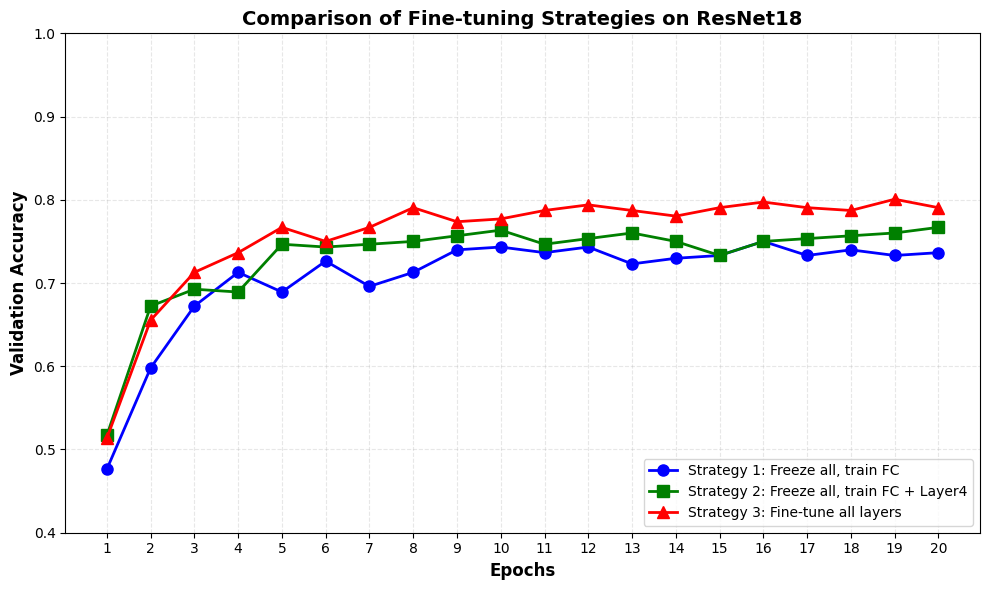

In [81]:
plot_metric(histories, 'valid_metrics', 'Validation Accuracy', True)

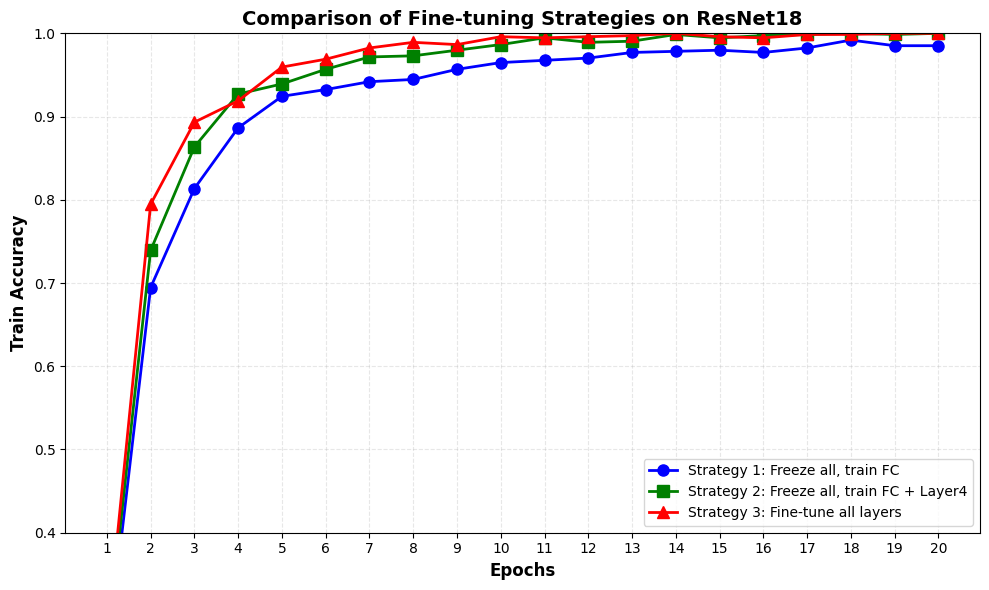

In [82]:
plot_metric('train_metrics', 'Train Accuracy', False)

<div class="rtl-fa" dir="rtl" style="text-align: right;">

**Q2.7:** سه حالت را بر اساس بهترین validation accuracy رتبه‌بندی کنید. آیا این ترتیب همان چیزی بود که بعد از خواندن Yosinski et al. انتظار داشتید؟ اگر `"all"` با وجود بازکردن بیشترین تعداد پارامترها بهترین نشد، نتیجه را به یک نکته‌ی مشخص از درس «داده‌ی کم» در Session 1 ربط دهید. فقط نگویید «پارامترهای بیشتر overfit می‌کنند»؛ دقیقاً بگویید چه چیزی در این مسئله کوچک است و چه چیزی در مقایسه با آن بزرگ است.

> **پاسخ شما:**

</div>


<div class="rtl-fa" dir="rtl" style="text-align: right;">

---
# بخش ۳ — دیدن چیزی که شبکه می‌بیند: Grad-CAM (حدود ۱.۵ ساعت)

تا اینجای ترم تقریباً همه‌چیز را با یک عدد سنجیده‌اید: accuracy. Grad-CAM سؤال کاملاً متفاوتی می‌پرسد: **برای یک پیش‌بینی مشخص، کدام پیکسل‌های تصویر واقعاً تصمیم مدل را هدایت کرده‌اند؟** این ابزار در تمرین کلاسی وجود نداشت و راهی تازه برای نگاه‌کردن *داخل* یک مدل آموزش‌دیده است.

## اول بخوانید: دقیقاً دو معادله

مقاله‌ی Selvaraju et al. با عنوان *"Grad-CAM: Visual Explanations from Deep Networks via Gradient-based Localization"* را باز کنید. دو معادله‌ی اصلی روش را پیدا کنید. این دو اوایل Section 3، درست بعد از معرفی روش، کنار هم آمده‌اند؛ ممکن است شماره‌ی معادله در نسخه‌های مختلف مقاله فرق کند، اما ترتیبشان همیشه یکی است: اول «وزن اهمیت نورون»، بعد heatmap نهایی.

**Q3.1:** معادله‌ی اول برای هر کانال `k` از activation mapهای یک لایه‌ی convolutional انتخاب‌شده، نسبت به کلاس `c` یک وزن $\alpha_k^c$ محاسبه می‌کند. معادله را بنویسید و با بیان خودتان توضیح دهید چه عملی روی $\frac{\partial y^c}{\partial A^k_{ij}}$ انجام می‌شود. راهنما: جمع‌کردن روی موقعیت‌های مکانی $i,j$ و تقسیم بر تعداد آن‌ها یعنی $Z$، عملی آشناست که قبلاً در این ترم استفاده کرده‌اید؛ نامش را بگویید.

> **پاسخ شما:**
> $$
\alpha_k^c = \frac{1}{Z} \sum_i \sum_j \frac{\partial y^c}{\partial A_{ij}^k}
$$
> نام عمل : Average pooling <br/>
> در حقیقت عمل می‌خواهد ببینید با تغییر نقشه ویژگی، چقدر خروجی تغییر می‌کند. با جمع روی تمامی مقادیر نقشه‌ی مورد نظر، مثلا نقشه شماره‌ی 1، می‌خواهد به وزنی برسد تا به وسیله‌ی آن، اهمیت نقشه‌ی ویژگی برای کلاس مورد نظر را محاسبه کند. 

**Q3.2:** معادله‌ی دوم وزن‌های $\alpha_k^c$ را با activation mapهای $A^k$ ترکیب می‌کند تا heatmap نهایی $L^c_{\text{Grad-CAM}}$ ساخته شود. معادله را بنویسید. چرا مقاله روی مجموع وزن‌دار ReLU اعمال می‌کند و همان مقدار خام را برنمی‌گرداند؟ یک مقدار **منفی** در یک پیکسل چه معنایی دارد و چرا شاید نخواهیم آن را به‌عنوان ناحیه‌ی «مهم» نمایش دهیم؟

> **پاسخ شما:**

$$
L^c_{\text{Grad-CAM}} = \text{ReLU} (\sum_k \alpha^c_k A^k)
$$

این عمل، جمع وزن‌دار نقشه‌های ویژگی است. هدف استخراج مکان‌های بااهمیت برای تمییز دادن کلاس مورد نظر است. عمل رلو هم برای حذف مقادیر منفی است. مقادیر منفی، سعی در اثبات این دارند که پیکسل مربوطه متعقل به کلاس دیگری است، یا به عبارتی، در تعیین کلاس مورد نظر، تاثیر منفی دارند.

**Q3.3 (انتخاب محل hook):** Grad-CAM هم به activation mapهای $A^k$ و هم به gradientهایی که به آن‌ها می‌رسند نیاز دارد؛ یعنی باید هنگام forward و backward به خروجی یک لایه‌ی میانی دسترسی داشته باشید، نه فقط به logits نهایی. در ResNet18 خروجی کدام module را هدف می‌گیرید؟ و چرا لازم است این خروجی متعلق به یک لایه‌ی **convolutional** باشد، نه مثلاً خروجی `avgpool` یا `fc`؟ پاسخ را به این نکته وصل کنید که feature map کانولوشنی چه اطلاعاتی را هنوز حفظ می‌کند که یک بردار feature تخت‌شده دیگر ندارد.

> **پاسخ شما:** <br/>
> خروجی لایه 4 را استفاده می‌کنیم. به دو دلیل.
> - آخرین لایه کانولوشنی حاوی ویژگی‌های سطح بالا برای تمیز دادن کلاس مورد استفاده واقع می‌شود.
> - برخلاف لایه‌های خطی، اطلاعات مکانی را حفظ می‌کند.
</div>


<div class="rtl-fa" dir="rtl" style="text-align: right;">

## پیاده‌سازی با hookها

`register_forward_hook` و `register_full_backward_hook` در PyTorch اجازه می‌دهند بدون هیچ تغییری در متد `forward` مدل، خروجی یک لایه و بعداً gradient همان خروجی را بگیرید. این سازوکار فقط برای Grad-CAM نیست و در کاربردهای دیگر هم مفید است.

**TODO:** کلاس `GradCAM` زیر را کامل کنید. لایه‌ی هدف شما `layer4` است؛ آخرین stage کانولوشنی ResNet18.

</div>


In [52]:
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.activations = None
        self.gradients = None

        # TODO: register a forward hook on `target_layer` that stores its
        #       output into self.activations (detach it, but keep it on DEVICE)
        def forward_hook(module, input, output):
            self.activations = output.detach()
        self.forward_handle = target_layer.register_forward_hook(forward_hook)

        def backward_hook(module, grad_input, grad_output):
            self.gradients = grad_output[0].detach()
    
        # TODO: register a full backward hook on `target_layer` that stores
        #       the gradient with respect to its OUTPUT into self.gradients
        #       (grad_output is a tuple; you want grad_output[0], detached)
        self.backward_handle = target_layer.register_full_backward_hook(backward_hook)
        
    def __call__(self, input_tensor, class_index=None):
        '''Run one image (shape [1, 3, 224, 224]) through the model and
        return a single-channel heatmap of shape [H, W] (same H, W as the
        target layer's activation maps).'''
        self.model.eval()
        logits = self.model(input_tensor)

        if class_index is None:
            class_index = logits.argmax(dim=1).item()

        # TODO: zero any existing gradients, then backpropagate from
        #       logits[0, class_index] (a scalar) to populate self.gradients
        #       via the backward hook you registered above.
        self.model.zero_grad()
        class_score = logits[0, class_index]
        class_score.backward()

        # TODO: compute alpha_k = mean of self.gradients over spatial dims (H, W),
        #       for each channel k -- this is Equation "alpha" from Q3.1.
        #       self.gradients has shape [1, C, H, W]; alpha should end up [C].
        alpha_k = self.gradients.mean(dim=(2, 3))

        # TODO: compute the weighted sum over channels: sum_k(alpha_k * activations_k),
        #       giving a [H, W] map, then apply ReLU -- this is the second equation.
        sum_k = (alpha_k[:, :, None, None] * self.activations).sum(dim=1)
        cam = torch.relu(sum_k)
        # TODO: return the [H, W] heatmap as a numpy array, normalized to [0, 1]
        #       (subtract its min, divide by its max, guarding against divide-by-zero)
        cam = cam.squeeze(0).detach()
        
        cam_min = cam.min()
        cam_max = cam.max()
        
        if cam_max > cam_min:
            cam = (cam - cam_min) / (cam_max - cam_min)
        else:
            cam = torch.zeros_like(cam)
        return cam

<div class="rtl-fa" dir="rtl" style="text-align: right;">

**TODO:** Grad-CAM را روی ۴ تصویر validation اجرا کنید که `feature_model` شما (baseline فریز‌شده‌ی بخش ۱) آن‌ها را **درست** پیش‌بینی کرده است. Heatmap را روی تصویر اصلی بیندازید. برای این کار heatmap را مثلاً با `cv2.resize` یا `torch.nn.functional.interpolate` به اندازه‌ی `224×224` بزرگ کنید و سپس با یک colormap مثل `"jet"` و `alpha=0.5` روی تصویر اصلی رسم کنید.

</div>


In [60]:
import torch.nn.functional as F

gradcam = GradCAM(feature_model, feature_model.layer4)

def overlay_heatmap(image_tensor, heatmap, mean=IMAGENET_MEAN, std=IMAGENET_STD):
    # TODO: denormalize image_tensor (mean/std), permute to (H, W, C), clamp to [0, 1]
    mean = torch.tensor(mean, device=image_tensor.device).view(3, 1, 1)
    std = torch.tensor(std, device=image_tensor.device).view(3, 1, 1)
    d_image_tensor = image_tensor * std + mean
    d_image_tensor = d_image_tensor.permute(1, 2, 0)
    d_image_tensor = d_image_tensor.clamp(0, 1)
    # TODO: resize `heatmap` (currently [h, w], likely 7x7 for ResNet18's layer4)
    #       up to 224x224 using F.interpolate on a reshaped [1, 1, h, w] tensor
    r_heatmap = F.interpolate(heatmap[None, None, :, :], (224, 224),mode="bilinear", align_corners=False)
    # TODO: plot the denormalized image, then plt.imshow(resized_heatmap, cmap="jet", alpha=0.5) on top
    plt.imshow(d_image_tensor.cpu().numpy(), cmap='jet')
    plt.imshow(r_heatmap.squeeze().cpu().numpy(), cmap="jet", alpha=0.5)


# TODO: find 4 validation images the frozen `feature_model` predicts CORRECTLY,
#       run gradcam on each (using the predicted class), and show the overlay
#       in a 2x2 grid with the breed name as the title.
#
# IMPORTANT GOTCHA: feature_model's backbone is entirely frozen
# (requires_grad=False everywhere except fc). If every tensor feeding into
# layer4 has requires_grad=False, PyTorch builds no autograd graph through it
# at all -- your backward hook will simply never fire, and self.gradients will
# stay None. Fix: before calling gradcam(...), do
#   single_image = images[i:i+1].clone().requires_grad_(True)
# so there's something upstream of layer4 for autograd to track, even though
# none of the model's own parameters need gradients for this to work.

In [74]:
def predict(model, valid_loader):
    X_batch, y_batch = next(iter(valid_loader))
    X_batch, y_batch = X_batch.to(DEVICE), y_batch.to(DEVICE)
    logits = model(X_batch)
    probs = torch.softmax(logits, dim=0)
    y_pred = torch.argmax(probs, dim=1)
    correct_mask = y_pred == y_batch
    true_preds = X_batch[correct_mask]
    true_labels = y_batch[correct_mask]
    return true_preds, true_labels

true_preds, true_labels = predict(feature_model, valid_loader)

In [75]:
true_labels.shape

torch.Size([13])

In [76]:
true_preds.shape

torch.Size([13, 3, 224, 224])

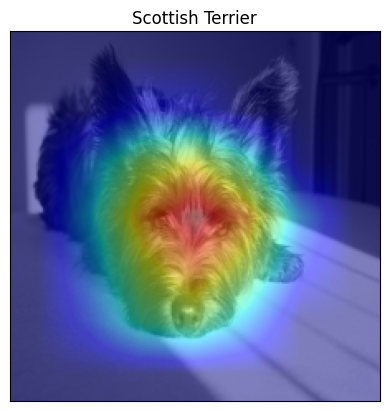

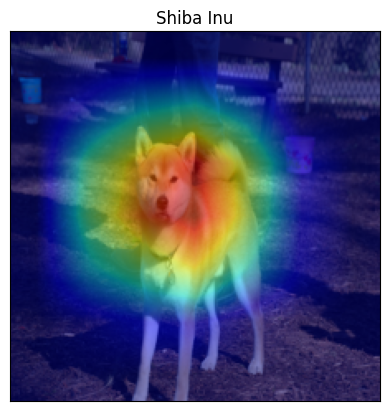

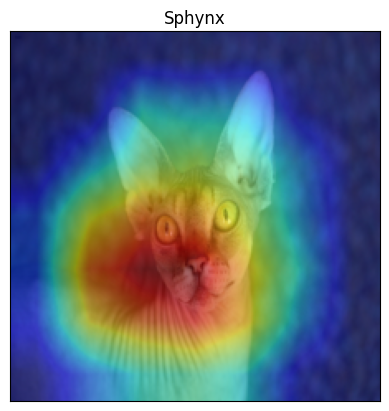

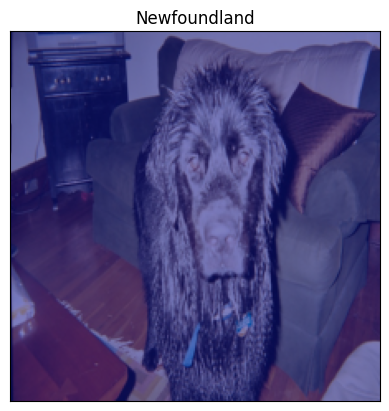

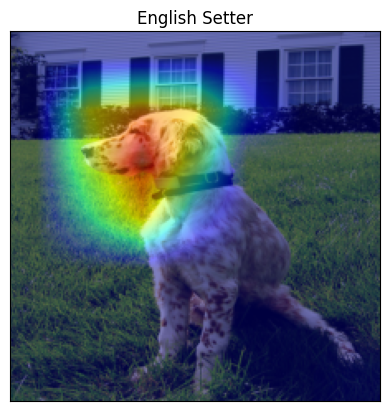

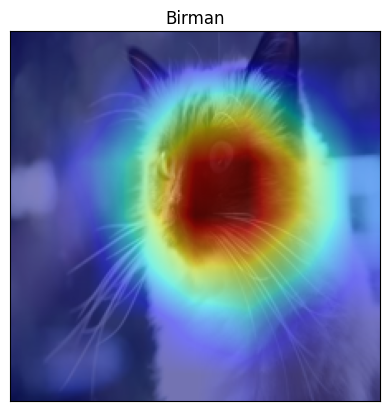

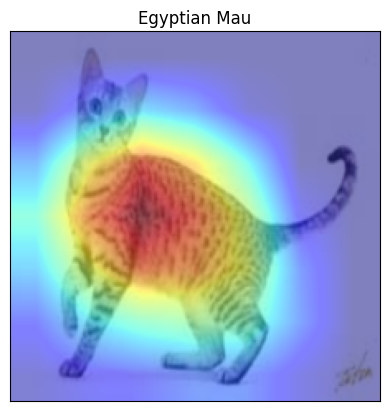

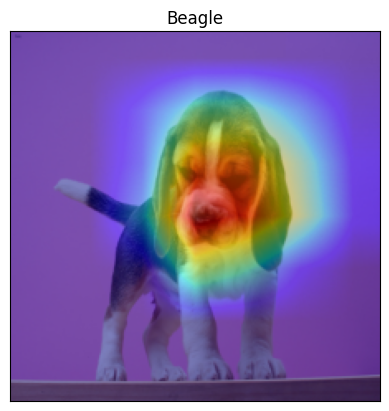

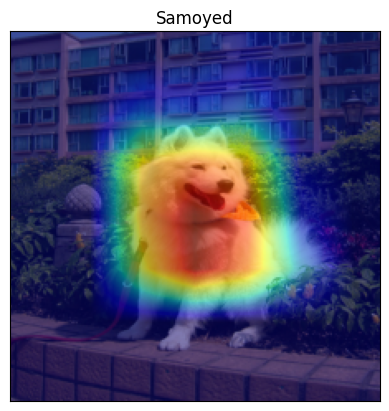

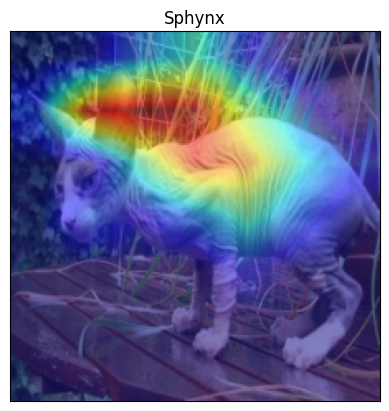

In [77]:
for i in range(10):
    plt.figure()
    plt.title(class_names[true_labels[i].cpu().item()])
    plt.xticks([])
    plt.yticks([])
    overlay_heatmap(true_preds[i], gradcam(true_preds[i:i+1].clone().requires_grad_(True)))

<div class="rtl-fa" dir="rtl" style="text-align: right;">

**Q3.4:** به ۴ heatmap نگاه کنید و متقاعدکننده‌ترین مورد را انتخاب کنید؛ یعنی موردی که ناحیه‌ی برجسته‌شده واقعاً شبیه بخشی باشد که یک انسان برای تشخیص آن نژاد به آن توجه می‌کند، مثل شکل گوش، الگوی مو یا صورت. در یک یا دو جمله توضیح دهید heatmap بیشتر روی چه ویژگی بصری متمرکز شده است.

> **پاسخ شما:** <br/>
> در موارد مشاهده شده روی سر، روی موها و پوست بدن و گاه کل بدن متمرکز شده است

**Q3.5 (بخش اصلی — مقایسه‌ی دو مدل):** حالا Grad-CAM را برای **همان یک تصویر** با دو مدل آموزش‌دیده اجرا کنید: `feature_model` فریز‌شده از بخش ۱ و بهترین مدل fine-tuned از بخش ۲ (`"layer4"` یا `"all"`، هرکدام validation accuracy بیشتری داشته است). تصویری انتخاب کنید که heatmapهای دو مدل در آن **واضحاً متفاوت** باشند. در یک یا دو جمله تفاوت را توضیح دهید: آیا fine-tuning توجه مدل را نسبت به مدل فریز‌شده به سمت یک ویژگی اختصاصی‌ترِ نژاد، مثل شکل گوش یا الگوی پوشش بدن، منتقل کرده است؟

> **پاسخ شما:**
برای گونه newfoundland <br/>
> مدل دوم بهتر عمل کرده.
> برای گونه‌ی <br/>
> sphynx
> هم مدل بیشتر روی پوست گربه زوم کرده. در مدل اولی محیط پس زمینه هم اهمیت پیدا کرده.
</div>


In [83]:
model, optimizer = make_finetune_model("all")

state_dict = torch.load(
    "models/all_model_weights.pth",
    map_location=DEVICE,
    weights_only=True
)

model.load_state_dict(state_dict)
model.to(DEVICE)
model.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [84]:
# true_preds_all, true_labels_all = predict(model, valid_loader)
gradcam2 = GradCAM(model, model.layer4)

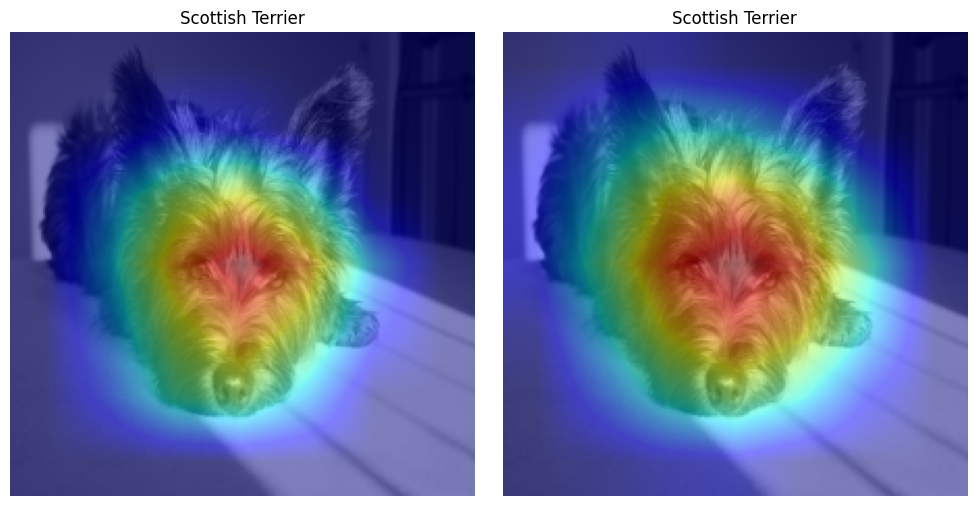

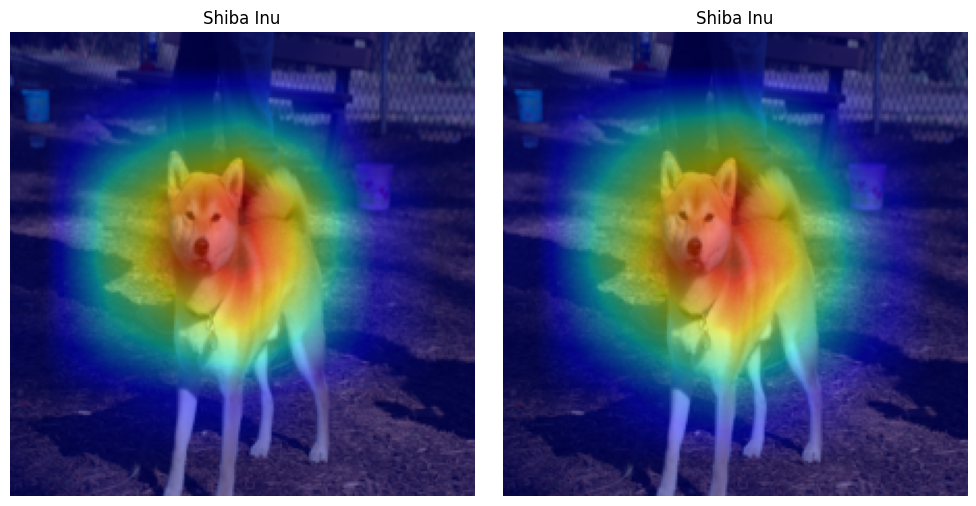

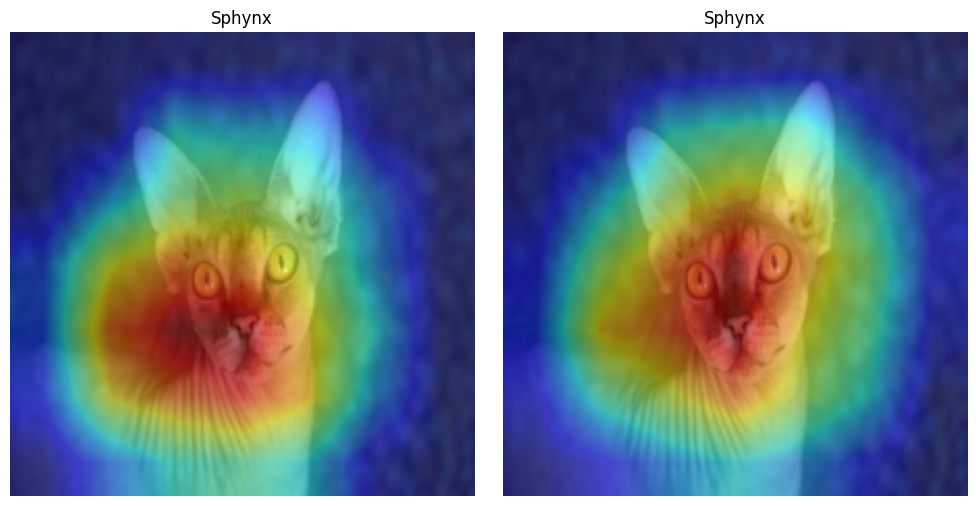

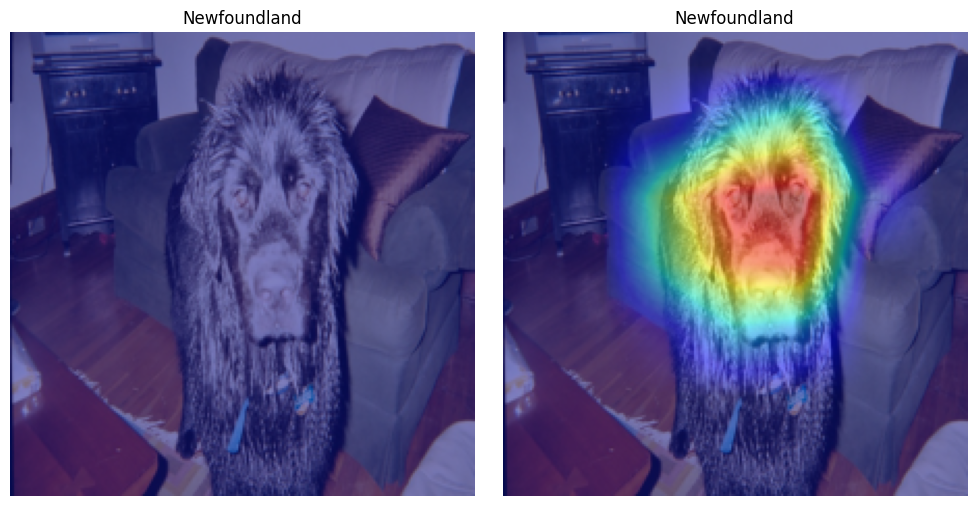

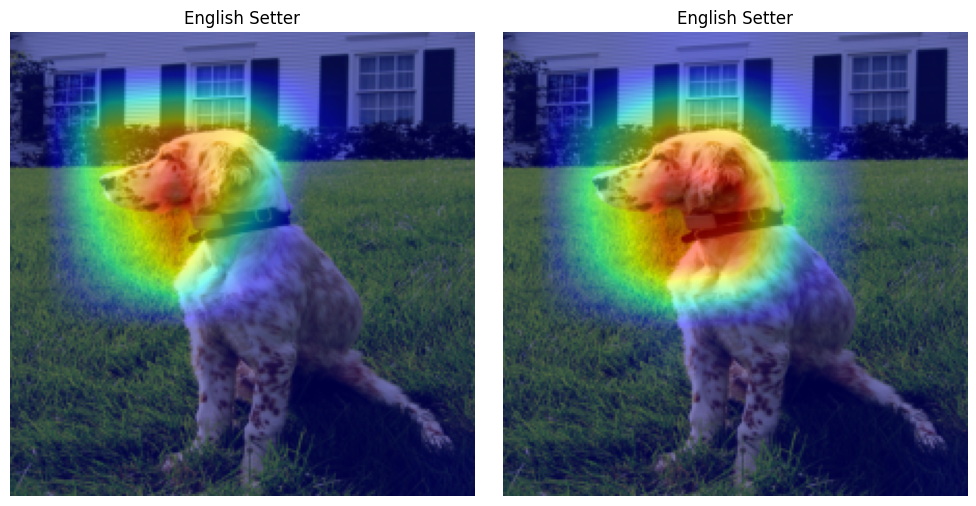

...

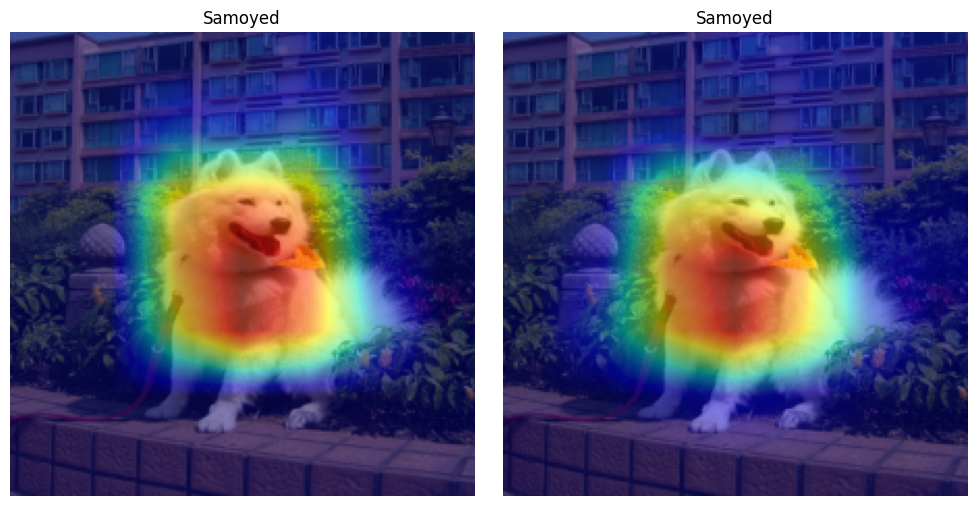

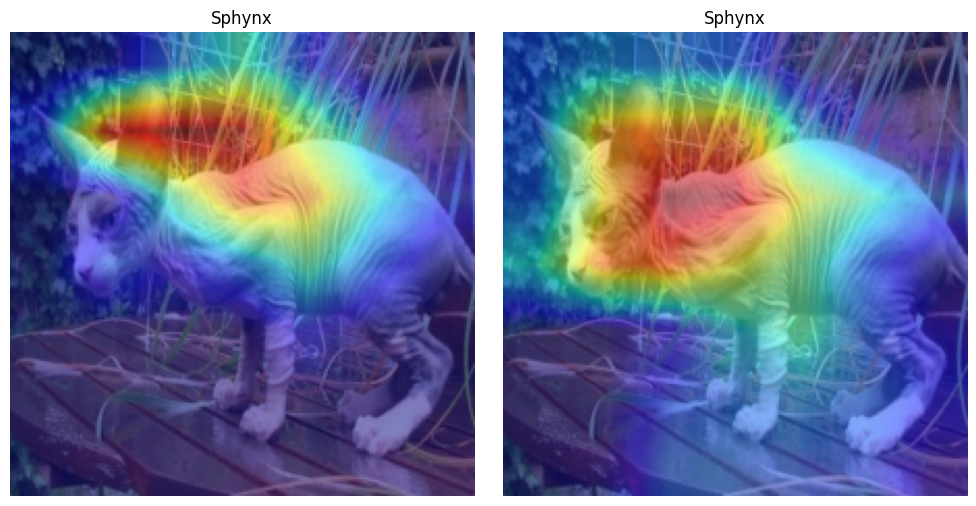

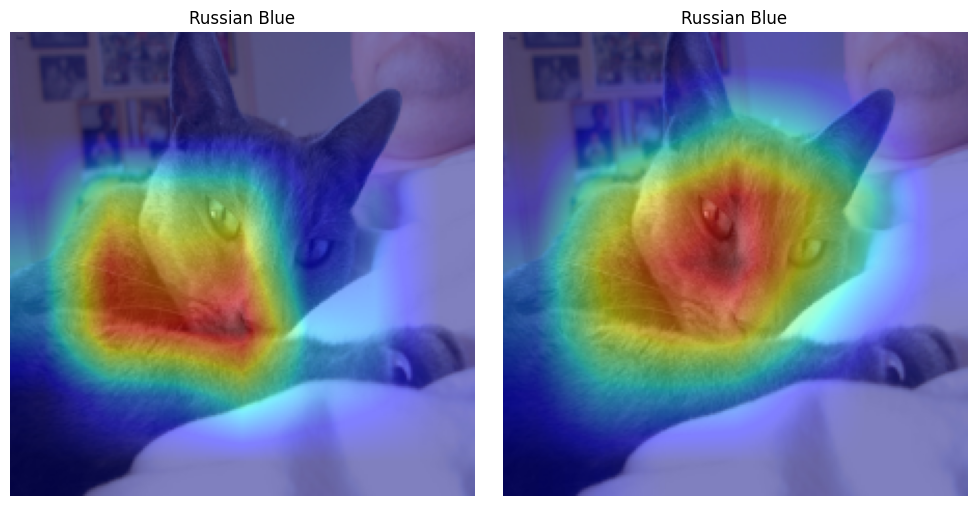

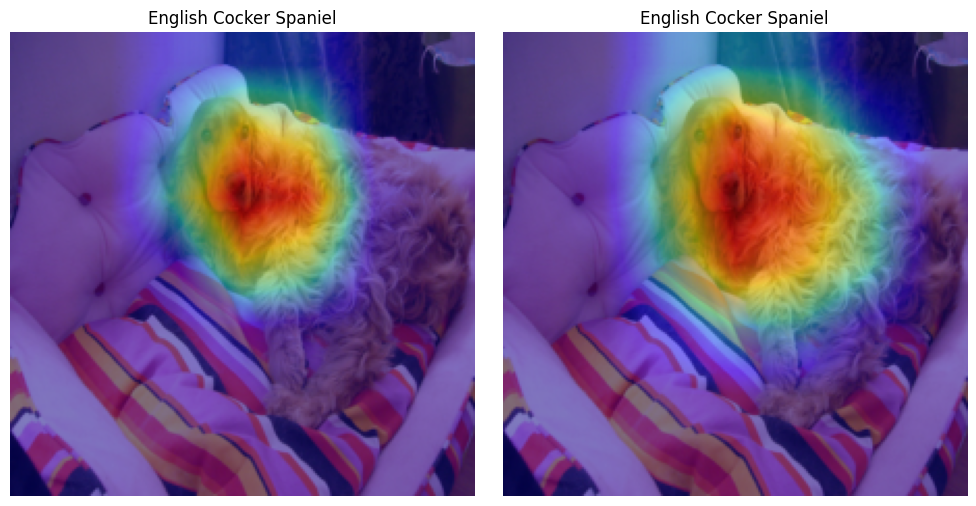

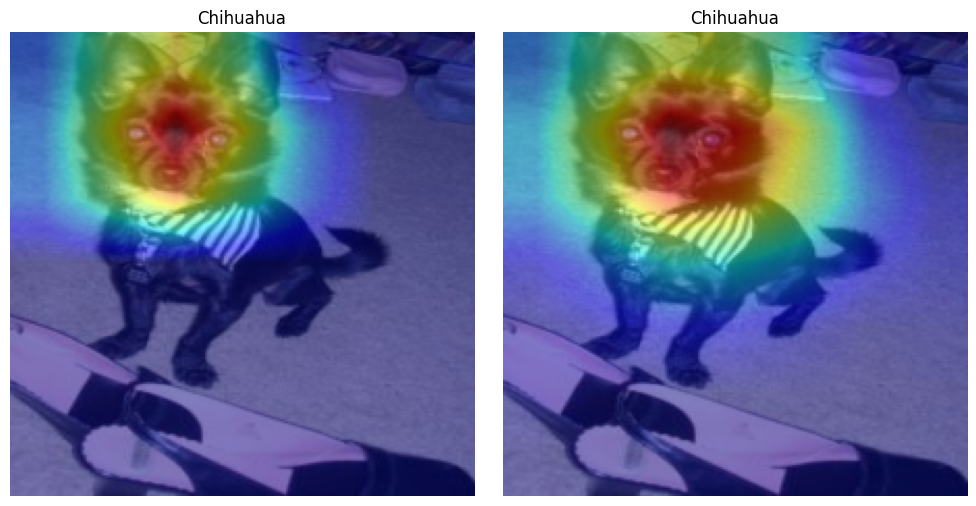

In [87]:
for i in range(13):
    plt.figure(figsize=(10, 5))
    plt.subplot(121)
    overlay_heatmap(true_preds[i], gradcam(true_preds[i:i+1].clone().requires_grad_(True)))
    plt.title(class_names[true_labels[i].cpu().item()])
    plt.axis("off")
    
    plt.subplot(122)
    overlay_heatmap(true_preds[i], gradcam2(true_preds[i:i+1].clone().requires_grad_(True)))
    plt.title(class_names[true_labels[i].cpu().item()])
    plt.axis("off")
    plt.tight_layout()
    plt.show()

<div class="rtl-fa" dir="rtl" style="text-align: right;">

---
# بخش ۴ — mixup: افزایشی که برچسب‌ها را هم ترکیب می‌کند (حدود ۱.۵ ساعت)

همه‌ی augmentationهایی که در تمرین‌های Session 1–2 طراحی کردید، هر بار فقط یک تصویر را تغییر می‌دادند و برچسب آن را دست‌نخورده می‌گذاشتند؛ مثلاً یک گربه‌ی flipشده هنوز ۱۰۰٪ «گربه» بود. **mixup** کار متفاوتی می‌کند: **دو** تصویر آموزشی را با هم ترکیب می‌کند و برچسب‌هایشان را هم متناسب با همان ترکیب مخلوط می‌کند. مثلاً نمونه‌ای می‌سازد که «۷۰٪ گربه‌ی Siamese و ۳۰٪ گربه‌ی Persian» است.

## اول بخوانید: دستور دقیق روش

مقاله‌ی Zhang et al. با عنوان *"mixup: Beyond Empirical Risk Minimization"* را باز کنید. معادله‌های اصلی Section 2 را پیدا کنید. این دو معادله بلافاصله بعد از معرفی mixup آمده‌اند و نشان می‌دهند چگونه از دو نمونه‌ی واقعی $(x_i, y_i)$ و $(x_j, y_j)$ یک نمونه‌ی مجازی $(\tilde{x}, \tilde{y})$ ساخته می‌شود.

**Q4.1:** هر دو معادله را بنویسید. $\lambda$ چه نقشی دارد و چه مقادیری می‌تواند بگیرد؟

> **پاسخ شما:** <br/>

$$
\begin{aligned}
\tilde{x} &= \lambda x_i + (1 - \lambda) x_j,
&& \text{where } x_i, x_j \text{ are raw input vectors}, \\[4pt]
\tilde{y} &= \lambda y_i + (1 - \lambda) y_j,
&& \text{where } y_i, y_j \text{ are one-hot label encodings}.
\end{aligned}
$$

لاندا تمام مقادیر اعشاری درون بازه‌ی بسته 0 و 1 را شامل می‌شود. لاندا به نوعی وزن است و میزان دخالت هر دیتا درون دیتای جدید را مشخص می‌کند. به عبارت دیگر، داده‌ی جدید به توزیع کدام کلاس نزدیک‌تر باشد، یا اینکه فاصله‌اش از هر توزیع چقدر باشد.

**Q4.2:** مقاله $\lambda$ را از توزیع $\text{Beta}(\alpha, \alpha)$ نمونه‌گیری می‌کند، نه اینکه مثلاً همیشه $\lambda = 0.5$ باشد. برای یک $\alpha$ کوچک مثل ۰.۲، بیشتر جرم احتمال نزدیک ۰ و ۱ قرار می‌گیرد و مقدارهای نزدیک ۰.۵ کمتر رخ می‌دهند. با این حساب، در یک batch معمولی که mixup روی آن اعمال شده، بیشتر نمونه‌های مجازی شبیه یک ترکیب واقعی ۵۰/۵۰ هستند یا بیشتر شبیه یک تصویر اصلی با فقط **ردّ کم‌رنگی** از تصویر دوم؟ چرا ممکن است نویسندگان این رفتار را به ترکیب همیشگی و مساوی ترجیح داده باشند؟

> **پاسخ شما:** <br/>
در مقاله مقدار آلفا کوچک در نظر گرفته شده، لذا داده‌ی تولید شده‌ی جدید به یک کلاس نزدیک‌تر خواهد شد. <br/>
> مقدار کوچک باعث می‌شود رژیم یادگیری متفاوت از حالات قبلی نشود ولی چنانچه خیلی بزرگ شود تصویری خواهیم داشت که هم جزو کلاس یک است و هم کلاس دو. اینجا هم سردرگمی خواهیم داشت و هم اینکه بایستی یک روش دیگری برای آموزش برگزینیم تا از این گنگی رها شویم.

**Q4.3 (یک ترفند کارآمد):** مقاله به یک جزئیات پیاده‌سازی اشاره می‌کند: به‌جای دو `DataLoader` جدا برای گرفتن دو تصویر تصادفی مستقل، می‌توانید فقط **یک** batch بگیرید، یک کپی از آن بسازید که نمونه‌هایش **shuffle** شده‌اند، و هر تصویر را با همتای shuffleشده‌ی خودش در همان batch ترکیب کنید. چرا این کار بدون `DataLoader` دوم هم جفت‌های معتبر و ظاهراً مستقل می‌سازد؟ راهنما: فکر کنید permutation تصادفی indexهای یک batch چه تضمینی درباره‌ی جفت‌شدن تصاویر ایجاد می‌کند.

> **پاسخ شما:** <br/>
> عملیات خواندن و نوشتن در کامپیوتر همیشه هزینه‌زاست. ساخت دو دیتالودر یعنی دوبار عملیات خواندن نوشتن، یعنی معطلی زیاد سی پی یو و کامپیوتر که در مقابل دستاوردی هم ندارد. پس بهتر است با یکبار خواندن یک دسته داده، آن را بر بزنیم و عملیات لازم را انجام دهیم.

</div>


<div class="rtl-fa" dir="rtl" style="text-align: right;">

## پیاده‌سازی

**TODO:** تابع `mixup_batch(images, labels, num_classes, alpha=0.2)` را بنویسید. این تابع باید یک $\lambda$ برای کل batch از `np.random.beta(alpha, alpha)` نمونه بگیرد، یک permutation تصادفی از indexها بسازد، `images` را با نمونه‌های shuffleشده ترکیب کند و برچسب‌های ترکیبی **one-hot** برگرداند. چون برچسب دیگر یک عدد صحیح نیست و به یک توزیع احتمال روی کلاس‌ها تبدیل شده است، `nn.CrossEntropyLoss` می‌تواند soft-label target را مستقیماً بپذیرد، به شرطی که احتمالات کلاس‌ها همان shape مربوط به logits را داشته باشند. گزینه‌ی دیگر این است که loss را دستی به‌صورت `lambda * loss_fn(logits, labels_a) + (1 - lambda) * loss_fn(logits, labels_b)` محاسبه کنید؛ این روش از نظر ریاضی معادل است و نیازی به ساخت one-hot ندارد. هرکدام را انتخاب کردید، واضح بنویسید کدام روش را پیاده‌سازی کرده‌اید.

</div>


In [10]:
batch_size = 10
indices = torch.randperm(batch_size)
len(class_names)

37

In [11]:
def mixup_batch(images, labels, alpha=0.2, seed=None):
    '''Return (mixed_images, labels_a, labels_b, lam) using the
    same-batch-shuffle trick from Q4.3.'''
    if seed is not None:
        np.random.seed(seed)
        torch.manual_seed(seed)

    # TODO: sample a single lambda from np.random.beta(alpha, alpha)
    lambda_value = float(np.random.beta(alpha, alpha))
    # TODO: build a random permutation of the batch indices (torch.randperm)
    batch_size = images.shape[0]
    permutation = torch.randperm(batch_size, device=images.device)
    # TODO: mixed_images = lam * images + (1 - lam) * images[permutation]
    mixed_images = lambda_value * images + (1 - lambda_value) * images[permutation]
    # TODO: labels_a = labels (original order), labels_b = labels[permutation]
    labels_a = labels.clone()
    labels_b = labels[permutation].clone()
    # TODO: return mixed_images, labels_a, labels_b, lam
    return mixed_images, labels_a, labels_b, lambda_value, permutation


def mixup_loss(loss_fn, logits, labels_a, labels_b, lam):
    # TODO: return lam * loss_fn(logits, labels_a) + (1 - lam) * loss_fn(logits, labels_b)
    return lam * loss_fn(logits, labels_a) + (1 - lam) * loss_fn(logits, labels_b)

<div class="rtl-fa" dir="rtl" style="text-align: right;">

**TODO:** قبل از اینکه به `mixup_batch` در حلقه‌ی training اعتماد کنید، یک sanity-check تصویری انجام دهید: یک تصویر mixed را کنار دو تصویر منبعش رسم کنید و مقدار $\lambda$ نمونه‌گیری‌شده را در عنوان نمایش دهید.

</div>


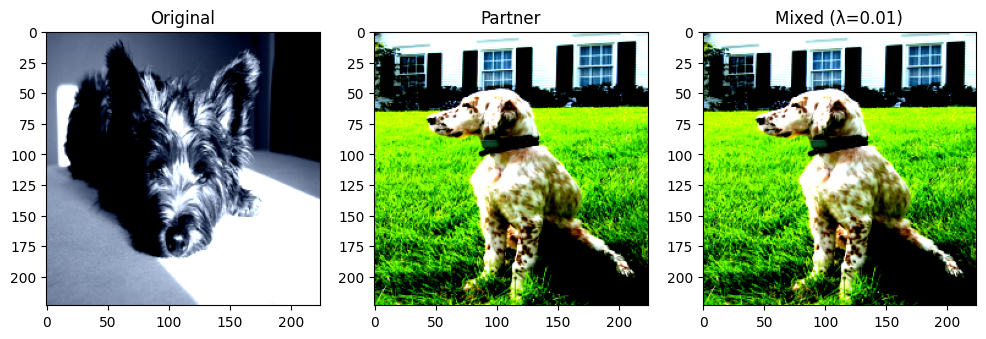

In [12]:
# TODO: grab one batch from train_loader
# train_dataset_aug = TransformSubset(raw_trainval, train_indices, train_transform)
train_loader = make_loader(val_dataset, shuffle=False)
images, labels = next(iter(train_loader))
# TODO: call mixup_batch on it
mixed_images, labels_a, labels_b, lam, permutation = mixup_batch(images, labels, alpha=0.2, seed=SEED)
# TODO: pick index 0, find its permutation partner, and plot all three images
#       (original, partner, and mixed) side by side with lambda in the title

idx = 0
partner_idx = permutation[idx].item()

plt.figure(figsize=(12, 4))
d_image = images[idx] * 0.5 + 0.5
d_image = torch.clip(d_image, 0, 1)
plt.subplot(131)
plt.imshow(d_image.permute(1, 2, 0))
plt.title("Original")

plt.subplot(132)
d_partner_image = images[partner_idx] * 0.5 + 0.5
d_partner_image = torch.clip(d_partner_image, 0, 1)
plt.imshow(d_partner_image.permute(1, 2, 0))
plt.title("Partner")

plt.subplot(133)
d_mixed_image = mixed_images[idx] * 0.5 + 0.5
d_mixed_image = torch.clip(d_mixed_image, 0, 1)
plt.imshow(d_mixed_image.permute(1, 2, 0))
plt.title(f"Mixed (λ={lam:.2f})")

plt.show()

<div class="rtl-fa" dir="rtl" style="text-align: right;">

**Q4.4 (قبل از اجرا پیش‌بینی کنید):** mixup در ابتدا روی دیتاست‌هایی ارزیابی شد که برای هر کلاس ده‌ها هزار تصویر داشتند. دیتاست حیوانات ما فقط ۲۰ تصویر از هر نژاد دارد. قبل از اجرای آزمایش زیر پیش‌بینی کنید: روی دیتاست به این کوچکی انتظار دارید mixup کمک کند، عملکرد را بدتر کند یا تفاوت زیادی ایجاد نکند؟ دلیل شما باید به چیزی وصل باشد که mixup اصولاً قرار است اصلاح کند. دوباره انگیزه‌ی بیان‌شده در Abstract مقاله را ببینید: کاهش حفظ‌کردن داده‌ها و حساسیت به ورودی‌های adversarial/غیرعادی. سپس آن را با چیزی مقایسه کنید که واقعاً عملکرد را در یک دیتاست کوچک و ریزدانه مثل این محدود می‌کند.

> **پاسخ شما (پیش‌بینی؛ قبل از اجرای بخش بعدی):** <br/>
به نظرم عملکرد مدل بهتر خواهد شد. مدل پیچیده روی دیتاست کم احتمال بالای بیش برازش دارد. با تکنیک جدید دنبال این خواهیم بود که از توزیع جدید داده بسازیم. پس تعداد داده‌ی اموزش داده شده بیشتر خواهد شد و خطر بیش برازش کاسته خواهد شد.

**TODO:** دو نسخه از مدل **frozen-feature** خود را آموزش دهید؛ همان روش بخش ۱ را دوباره استفاده کنید و اینجا fine-tuning نکنید تا اثر mixup را جدا از تغییرات بخش ۲ بسنجیم. هر دو مدل را برای تعداد epoch یکسان آموزش دهید: یکی با training معمولی و دیگری با اعمال `mixup_batch`/`mixup_loss` روی هر batch آموزشی. validation باید کاملاً بدون تغییر بماند؛ هنگام ارزیابی mixup اعمال نکنید. دلیل این موضوع را باید از درس «Flickering Metric» در تمرین کلاسی بتوانید توضیح دهید.

</div>


In [17]:
weights = ResNet18_Weights.DEFAULT

feature_model = resnet18(weights=weights)
# freeze every parameter
freeze_layers(feature_model, layer_names=None, unfreeze=False)
# print("Trainable modules after freezing all layers")
# print_trainable_params(feature_model)
# TODO: replace feature_model.fc with a fresh nn.Linear(..., NUM_CLASSES)
num_features = feature_model.fc.in_features
feature_model.fc = nn.Linear(num_features, NUM_CLASSES)
feature_model = feature_model.to(DEVICE)
feature_model.trainable_modules = [feature_model.fc]
# print("Trainable modules after adding new fc to the model")
# print_trainable_params(feature_model)

optimizer = torch.optim.Adam(feature_model.fc.parameters(), lr=1e-3)
loss_fn = nn.CrossEntropyLoss()
metric = torchmetrics.Accuracy(task="multiclass",
                                 num_classes=NUM_CLASSES).to(DEVICE)

print("Training ...\n\n")
n_epochs = 20
history1 = train(feature_model, optimizer, loss_fn, metric, train_loader, valid_loader,
          n_epochs, patience=2, factor=0.5, epoch_callback=None, device=DEVICE)

Training ...




Epoch 1/20 [Train]: 100%|███████████████████████████████████████████████████████████████████| 47/47 [00:15<00:00,  2.94batch/s, loss=2.9778, metric=26.76%]
                                                                                                                                                           


Epoch 1/20 - Train Loss: 2.9778, Train Metric: 26.76%, Valid Metric: 51.69%, LR: 1.00e-03



Epoch 2/20 [Train]: 100%|███████████████████████████████████████████████████████████████████| 47/47 [00:18<00:00,  2.51batch/s, loss=1.6009, metric=70.68%]
                                                                                                                                                           


Epoch 2/20 - Train Loss: 1.6009, Train Metric: 70.68%, Valid Metric: 64.86%, LR: 1.00e-03



Epoch 3/20 [Train]: 100%|███████████████████████████████████████████████████████████████████| 47/47 [00:18<00:00,  2.60batch/s, loss=1.0462, metric=83.78%]
                                                                                                                                                           


Epoch 3/20 - Train Loss: 1.0462, Train Metric: 83.78%, Valid Metric: 68.24%, LR: 1.00e-03



Epoch 4/20 [Train]: 100%|███████████████████████████████████████████████████████████████████| 47/47 [00:17<00:00,  2.72batch/s, loss=0.7659, metric=87.03%]
                                                                                                                                                           


Epoch 4/20 - Train Loss: 0.7659, Train Metric: 87.03%, Valid Metric: 70.95%, LR: 1.00e-03



Epoch 5/20 [Train]: 100%|███████████████████████████████████████████████████████████████████| 47/47 [00:17<00:00,  2.63batch/s, loss=0.6220, metric=90.81%]
                                                                                                                                                           


Epoch 5/20 - Train Loss: 0.6220, Train Metric: 90.81%, Valid Metric: 71.28%, LR: 1.00e-03



Epoch 6/20 [Train]: 100%|███████████████████████████████████████████████████████████████████| 47/47 [00:17<00:00,  2.70batch/s, loss=0.4846, metric=92.97%]
                                                                                                                                                           


Epoch 6/20 - Train Loss: 0.4846, Train Metric: 92.97%, Valid Metric: 73.31%, LR: 1.00e-03



Epoch 7/20 [Train]: 100%|███████████████████████████████████████████████████████████████████| 47/47 [00:18<00:00,  2.60batch/s, loss=0.4316, metric=94.32%]
                                                                                                                                                           


Epoch 7/20 - Train Loss: 0.4316, Train Metric: 94.32%, Valid Metric: 72.97%, LR: 1.00e-03



Epoch 8/20 [Train]: 100%|███████████████████████████████████████████████████████████████████| 47/47 [00:18<00:00,  2.60batch/s, loss=0.3553, metric=95.41%]
                                                                                                                                                           


Epoch 8/20 - Train Loss: 0.3553, Train Metric: 95.41%, Valid Metric: 73.65%, LR: 1.00e-03



Epoch 9/20 [Train]: 100%|███████████████████████████████████████████████████████████████████| 47/47 [00:17<00:00,  2.69batch/s, loss=0.3319, metric=95.95%]
                                                                                                                                                           


Epoch 9/20 - Train Loss: 0.3319, Train Metric: 95.95%, Valid Metric: 71.96%, LR: 1.00e-03



Epoch 10/20 [Train]: 100%|██████████████████████████████████████████████████████████████████| 47/47 [00:18<00:00,  2.59batch/s, loss=0.2720, metric=96.62%]
                                                                                                                                                           


Epoch 10/20 - Train Loss: 0.2720, Train Metric: 96.62%, Valid Metric: 73.99%, LR: 1.00e-03



Epoch 11/20 [Train]: 100%|██████████████████████████████████████████████████████████████████| 47/47 [00:16<00:00,  2.78batch/s, loss=0.2562, metric=96.89%]
                                                                                                                                                           


Epoch 11/20 - Train Loss: 0.2562, Train Metric: 96.89%, Valid Metric: 72.30%, LR: 1.00e-03



Epoch 12/20 [Train]: 100%|██████████████████████████████████████████████████████████████████| 47/47 [00:17<00:00,  2.64batch/s, loss=0.2483, metric=97.30%]
                                                                                                                                                           


Epoch 12/20 - Train Loss: 0.2483, Train Metric: 97.30%, Valid Metric: 71.62%, LR: 1.00e-03



Epoch 13/20 [Train]: 100%|██████████████████████████████████████████████████████████████████| 47/47 [00:18<00:00,  2.59batch/s, loss=0.2520, metric=96.22%]
                                                                                                                                                           


Epoch 13/20 - Train Loss: 0.2520, Train Metric: 96.22%, Valid Metric: 72.30%, LR: 5.00e-04



Epoch 14/20 [Train]: 100%|██████████████████████████████████████████████████████████████████| 47/47 [00:16<00:00,  2.79batch/s, loss=0.1786, metric=98.11%]
                                                                                                                                                           


Epoch 14/20 - Train Loss: 0.1786, Train Metric: 98.11%, Valid Metric: 74.32%, LR: 5.00e-04



Epoch 15/20 [Train]: 100%|██████████████████████████████████████████████████████████████████| 47/47 [00:18<00:00,  2.59batch/s, loss=0.1616, metric=99.46%]
                                                                                                                                                           


Epoch 15/20 - Train Loss: 0.1616, Train Metric: 99.46%, Valid Metric: 74.32%, LR: 5.00e-04



Epoch 16/20 [Train]: 100%|██████████████████████████████████████████████████████████████████| 47/47 [00:18<00:00,  2.54batch/s, loss=0.1610, metric=99.19%]
                                                                                                                                                           


Epoch 16/20 - Train Loss: 0.1610, Train Metric: 99.19%, Valid Metric: 72.64%, LR: 5.00e-04



Epoch 17/20 [Train]: 100%|██████████████████████████████████████████████████████████████████| 47/47 [00:18<00:00,  2.55batch/s, loss=0.1635, metric=98.11%]
                                                                                                                                                           


Epoch 17/20 - Train Loss: 0.1635, Train Metric: 98.11%, Valid Metric: 72.30%, LR: 2.50e-04



Epoch 18/20 [Train]: 100%|██████████████████████████████████████████████████████████████████| 47/47 [00:18<00:00,  2.51batch/s, loss=0.1469, metric=99.19%]
                                                                                                                                                           


Epoch 18/20 - Train Loss: 0.1469, Train Metric: 99.19%, Valid Metric: 72.30%, LR: 2.50e-04



Epoch 19/20 [Train]: 100%|██████████████████████████████████████████████████████████████████| 47/47 [00:18<00:00,  2.58batch/s, loss=0.1413, metric=99.19%]
                                                                                                                                                           


Epoch 19/20 - Train Loss: 0.1413, Train Metric: 99.19%, Valid Metric: 72.97%, LR: 2.50e-04



Epoch 20/20 [Train]: 100%|██████████████████████████████████████████████████████████████████| 47/47 [00:18<00:00,  2.53batch/s, loss=0.1380, metric=99.19%]
                                                                                                                                                           


Epoch 20/20 - Train Loss: 0.1380, Train Metric: 99.19%, Valid Metric: 72.64%, LR: 1.25e-04



In [32]:
def train2(model, optimizer, loss_fn, metric, train_loader, valid_loader,
          n_epochs, patience=2, factor=0.5, epoch_callback=None, device='cuda'):
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode="max", patience=patience, factor=factor)
    history = {"train_losses": [], "valid_metrics": []}
    
    for epoch in range(n_epochs):
        total_loss = 0.0
        metric.reset()
        model.train()
        
        if epoch_callback is not None:
            epoch_callback(model, epoch)
        
        # Create progress bar for this epoch
        train_pbar = tqdm(train_loader, 
                         desc=f"Epoch {epoch+1}/{n_epochs} [Train]",
                         leave=True,  # Keep the bar after completion
                         unit="batch",
                         dynamic_ncols=True)  # Adapt to terminal width
        
        for batch_idx, (X_batch, y_batch) in enumerate(train_pbar):
            X_batch, y_batch = X_batch.to(device), y_batch.to(device)
            mixed_images, labels_a, labels_b, lam, _ = mixup_batch(X_batch, y_batch)
            y_pred = model(mixed_images)
            loss = mixup_loss(loss_fn, y_pred, labels_a, labels_b, lam)
            total_loss += loss.item()
            
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()
           
            # Update progress bar with current metrics (only once per batch)
            avg_loss = total_loss / (batch_idx + 1)
            train_pbar.set_postfix({
                'loss': f'{avg_loss:.4f}',
            })
        
        # Calculate epoch averages
        avg_train_loss = total_loss / len(train_loader)
        
        history["train_losses"].append(avg_train_loss)

        
        # Validation
        val_metric = evaluate_tm(model, valid_loader, metric, device=device)
        history["valid_metrics"].append(val_metric)
        scheduler.step(val_metric)
        
        # Print epoch summary (clear line and print)
        print(f"\nEpoch {epoch+1}/{n_epochs} - "
              f"Train Loss: {avg_train_loss:.4f}, "
              f"Valid Metric: {val_metric:.2%}, "
              f"LR: {optimizer.param_groups[0]['lr']:.2e}\n")
    
    return history

In [33]:
weights = ResNet18_Weights.DEFAULT

feature_model = resnet18(weights=weights)
# freeze every parameter
freeze_layers(feature_model, layer_names=None, unfreeze=False)
# print("Trainable modules after freezing all layers")
# print_trainable_params(feature_model)
# TODO: replace feature_model.fc with a fresh nn.Linear(..., NUM_CLASSES)
num_features = feature_model.fc.in_features
feature_model.fc = nn.Linear(num_features, NUM_CLASSES)
feature_model = feature_model.to(DEVICE)
feature_model.trainable_modules = [feature_model.fc]
# print("Trainable modules after adding new fc to the model")
# print_trainable_params(feature_model)

optimizer = torch.optim.Adam(feature_model.fc.parameters(), lr=1e-3)
loss_fn = nn.CrossEntropyLoss()
metric = torchmetrics.Accuracy(task="multiclass",
                                 num_classes=NUM_CLASSES).to(DEVICE)

print("Training ...\n\n")
n_epochs = 20
history2 = train2(feature_model, optimizer, loss_fn, metric, train_loader, valid_loader,
          n_epochs, patience=2, factor=0.5, epoch_callback=None, device=DEVICE)

Training ...




Epoch 1/20 [Train]: 100%|██████████████████████████████████████████████████████████████████████████████████| 47/47 [00:15<00:00,  3.01batch/s, loss=3.1657]
                                                                                                                                                           


Epoch 1/20 - Train Loss: 3.1657, Valid Metric: 45.95%, LR: 1.00e-03



Epoch 2/20 [Train]: 100%|██████████████████████████████████████████████████████████████████████████████████| 47/47 [00:17<00:00,  2.65batch/s, loss=2.0407]
                                                                                                                                                           


Epoch 2/20 - Train Loss: 2.0407, Valid Metric: 61.49%, LR: 1.00e-03



Epoch 3/20 [Train]: 100%|██████████████████████████████████████████████████████████████████████████████████| 47/47 [00:17<00:00,  2.64batch/s, loss=1.5790]
                                                                                                                                                           


Epoch 3/20 - Train Loss: 1.5790, Valid Metric: 68.92%, LR: 1.00e-03



Epoch 4/20 [Train]: 100%|██████████████████████████████████████████████████████████████████████████████████| 47/47 [00:18<00:00,  2.59batch/s, loss=1.4062]
                                                                                                                                                           


Epoch 4/20 - Train Loss: 1.4062, Valid Metric: 69.26%, LR: 1.00e-03



Epoch 5/20 [Train]: 100%|██████████████████████████████████████████████████████████████████████████████████| 47/47 [00:18<00:00,  2.58batch/s, loss=1.0724]
                                                                                                                                                           


Epoch 5/20 - Train Loss: 1.0724, Valid Metric: 70.95%, LR: 1.00e-03



Epoch 6/20 [Train]: 100%|██████████████████████████████████████████████████████████████████████████████████| 47/47 [00:18<00:00,  2.57batch/s, loss=1.0790]
                                                                                                                                                           


Epoch 6/20 - Train Loss: 1.0790, Valid Metric: 70.27%, LR: 1.00e-03



Epoch 7/20 [Train]: 100%|██████████████████████████████████████████████████████████████████████████████████| 47/47 [00:17<00:00,  2.64batch/s, loss=1.1453]
                                                                                                                                                           


Epoch 7/20 - Train Loss: 1.1453, Valid Metric: 70.61%, LR: 1.00e-03



Epoch 8/20 [Train]: 100%|██████████████████████████████████████████████████████████████████████████████████| 47/47 [00:18<00:00,  2.57batch/s, loss=0.8621]
                                                                                                                                                           


Epoch 8/20 - Train Loss: 0.8621, Valid Metric: 73.65%, LR: 1.00e-03



Epoch 9/20 [Train]: 100%|██████████████████████████████████████████████████████████████████████████████████| 47/47 [00:18<00:00,  2.60batch/s, loss=0.8800]
                                                                                                                                                           


Epoch 9/20 - Train Loss: 0.8800, Valid Metric: 74.32%, LR: 1.00e-03



Epoch 10/20 [Train]: 100%|█████████████████████████████████████████████████████████████████████████████████| 47/47 [00:18<00:00,  2.60batch/s, loss=0.9397]
                                                                                                                                                           


Epoch 10/20 - Train Loss: 0.9397, Valid Metric: 72.97%, LR: 1.00e-03



Epoch 11/20 [Train]: 100%|█████████████████████████████████████████████████████████████████████████████████| 47/47 [00:17<00:00,  2.61batch/s, loss=0.9729]
                                                                                                                                                           


Epoch 11/20 - Train Loss: 0.9729, Valid Metric: 70.61%, LR: 1.00e-03



Epoch 12/20 [Train]: 100%|█████████████████████████████████████████████████████████████████████████████████| 47/47 [00:18<00:00,  2.59batch/s, loss=0.8412]
                                                                                                                                                           


Epoch 12/20 - Train Loss: 0.8412, Valid Metric: 73.31%, LR: 5.00e-04



Epoch 13/20 [Train]: 100%|█████████████████████████████████████████████████████████████████████████████████| 47/47 [00:17<00:00,  2.62batch/s, loss=0.7167]
                                                                                                                                                           


Epoch 13/20 - Train Loss: 0.7167, Valid Metric: 73.65%, LR: 5.00e-04



Epoch 14/20 [Train]: 100%|█████████████████████████████████████████████████████████████████████████████████| 47/47 [00:18<00:00,  2.53batch/s, loss=0.8243]
                                                                                                                                                           


Epoch 14/20 - Train Loss: 0.8243, Valid Metric: 74.66%, LR: 5.00e-04



Epoch 15/20 [Train]: 100%|█████████████████████████████████████████████████████████████████████████████████| 47/47 [00:18<00:00,  2.60batch/s, loss=1.0120]
                                                                                                                                                           


Epoch 15/20 - Train Loss: 1.0120, Valid Metric: 73.65%, LR: 5.00e-04



Epoch 16/20 [Train]: 100%|█████████████████████████████████████████████████████████████████████████████████| 47/47 [00:18<00:00,  2.55batch/s, loss=0.9703]
                                                                                                                                                           


Epoch 16/20 - Train Loss: 0.9703, Valid Metric: 75.00%, LR: 5.00e-04



Epoch 17/20 [Train]: 100%|█████████████████████████████████████████████████████████████████████████████████| 47/47 [00:18<00:00,  2.60batch/s, loss=0.9093]
                                                                                                                                                           


Epoch 17/20 - Train Loss: 0.9093, Valid Metric: 72.64%, LR: 5.00e-04



Epoch 18/20 [Train]: 100%|█████████████████████████████████████████████████████████████████████████████████| 47/47 [00:18<00:00,  2.55batch/s, loss=0.6152]
                                                                                                                                                           


Epoch 18/20 - Train Loss: 0.6152, Valid Metric: 73.99%, LR: 5.00e-04



Epoch 19/20 [Train]: 100%|█████████████████████████████████████████████████████████████████████████████████| 47/47 [00:18<00:00,  2.56batch/s, loss=0.6994]
                                                                                                                                                           


Epoch 19/20 - Train Loss: 0.6994, Valid Metric: 73.65%, LR: 2.50e-04



Epoch 20/20 [Train]: 100%|█████████████████████████████████████████████████████████████████████████████████| 47/47 [00:18<00:00,  2.59batch/s, loss=0.7109]
                                                                                                                                                           


Epoch 20/20 - Train Loss: 0.7109, Valid Metric: 73.31%, LR: 2.50e-04



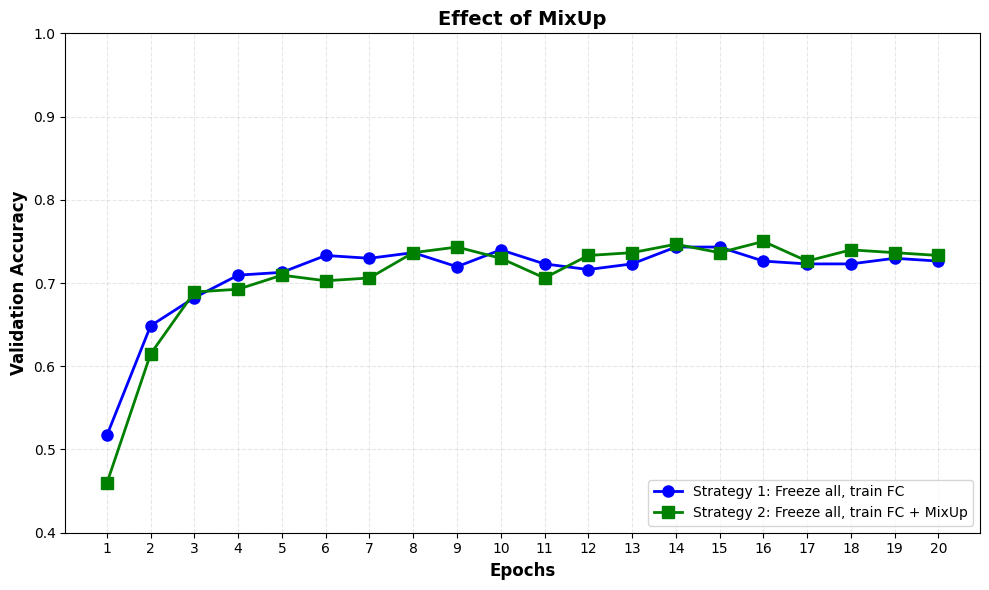

In [36]:
histories = [history1, history2]

plt.figure(figsize=(10, 6))
epochs = range(1, n_epochs + 1)
val_acc_strategy1 = [val.item() for val in histories[0]['valid_metrics']]
val_acc_strategy2 = [val.item() for val in histories[1]['valid_metrics']]

plt.plot(epochs, val_acc_strategy1, 
         marker='o', linewidth=2, markersize=8, 
         label='Strategy 1: Freeze all, train FC', color='blue')

plt.plot(epochs, val_acc_strategy2, 
         marker='s', linewidth=2, markersize=8, 
         label='Strategy 2: Freeze all, train FC + MixUp', color='green')

# Customize the plot
plt.xlabel('Epochs', fontsize=12, fontweight='bold')
plt.ylabel('Validation Accuracy', fontsize=12, fontweight='bold')
plt.title('Effect of MixUp', fontsize=14, fontweight='bold')
plt.legend(loc='lower right', fontsize=10)
plt.grid(True, alpha=0.3, linestyle='--')
plt.ylim([0.4, 1.0])  # Set y-axis limits
plt.xticks(epochs)  # Show all epoch numbers
plt.tight_layout()
plt.show()

In [ ]:
# TODO: train "plain_model" with the Part 1 recipe (frozen backbone, ordinary training)
#       for a fixed number of epochs, recording val_accuracy per epoch

# TODO: train "mixup_model" -- same recipe, same number of epochs, same starting
#       seed/weights, but inside the training loop for each batch:
#         mixed_images, labels_a, labels_b, lam = mixup_batch(images, labels)
#         logits = model(mixed_images)
#         loss = mixup_loss(loss_fn, logits, labels_a, labels_b, lam)
#       (validation loop is UNCHANGED -- plain images, plain labels, plain loss)

# TODO: print/plot both val_accuracy curves together

<div class="rtl-fa" dir="rtl" style="text-align: right;">

**Q4.5:** آیا پیش‌بینی Q4.4 شما درست از آب درآمد؟ فارغ از نتیجه، یک تغییر مشخص برای آزمایش پیشنهاد دهید که فکر می‌کنید فرصت منصفانه‌تری به mixup می‌دهد تا روی همین دیتاست مفید بودنش را نشان دهد؛ مثلاً epoch بیشتر، `alpha` متفاوت، تعداد تصویر بیشتر برای هر کلاس، یا استفاده از mixup فقط بعد از بازکردن بخش بیشتری از شبکه. کوتاه توضیح دهید چرا این تغییر می‌تواند کمک کند.

> **پاسخ شما:**

</div>


<div class="rtl-fa" dir="rtl" style="text-align: right;">

---
# بخش ۵ — تمرین اختیاری: حتی ResNet هم محدودیت دارد (حدود ۳۰ دقیقه)

در بخش ۱ تمرین کلاسی از نتایج **ImageNet** در مقاله‌ی ResNet (Table 2 و Figure 4) استفاده کردید تا مسئله‌ی degradation و نقش residual connectionها در حل آن را بررسی کنید. همان مقاله یک آزمایش دوم روی **CIFAR-10** دارد که خیلی از خوانندگان به آن نمی‌رسند و داستان «residual connection مشکل عمق را حل می‌کند» را کمی پیچیده‌تر می‌کند.

مقاله را باز کنید و **Section 4.2, "CIFAR-10 and Analysis"** را پیدا کنید. نویسندگان شبکه‌های plain و residual با عمق‌های مختلف مثل ۲۰، ۳۲، ۴۴ و ۵۶ لایه را آموزش می‌دهند و بعد، به‌عنوان یک stress test، یک شبکه‌ی residual **بسیار بسیار عمیق** را هم آموزش می‌دهند.

**Q5.1:** عمق عمیق‌ترین شبکه‌ای را که در این بخش آموزش داده شده پیدا کنید؛ دنبال عددی در محدوده‌ی صدها یا بیشتر بگردید. training error آن در مقایسه با یک شبکه‌ی residual خیلی کم‌عمق‌تر، مثلاً مدل ۱۱۰لایه که با همان روش آموزش دیده، چگونه بود؟ شبکه‌ی فوق‌عمیق بهتر بود، بدتر بود یا تقریباً همان عملکرد را داشت؟

> **پاسخ شما:**

**Q5.2 (نکته‌ی ظریف):** در تمرین کلاسی یک بخش کامل صرف تفاوت بین *degradation* — مشکلی در training error که residual connectionها آن را حل می‌کنند — و *overfitting* — مشکلی در generalization — شد. با توجه به چیزی که در Q5.1 پیدا کردید، مشکل شبکه‌ی فوق‌عمیق بیشتر شبیه degradation کلاسیک است، یا مقاله توضیح متفاوتی برای این دارد که چرا حتی با residual connectionها «خیلی عمیق‌تر شدن» دیگر فایده‌ای نداشت؟ توضیح خود مقاله را نقل‌قول کوتاه یا با بیان خودتان بازنویسی کنید.

> **پاسخ شما:**

**Q5.3 (ارتباط با نتایج خودتان):** در بخش ۲ و Q2.7 حالت‌های fine-tuning یعنی `"none"`، `"layer4"` و `"all"` را مقایسه کردید و احتمالاً دیدید که بازکردن *همه‌چیز* روی دیتاست کوچک حیوانات بهترین انتخاب نبود. در **یک جمله** نکته‌ی مشترک بین این نتیجه و چیزی که درباره‌ی ResNet با بیش از ۱۰۰۰ لایه روی CIFAR-10 خواندید را بیان کنید: هر دو مثال‌هایی هستند که در آن «ظرفیت بیشتر برای سازگارشدن» دیگر مجانی نیست. آن منبع محدودی که در هر دو مسئله کم است چیست؟

> **پاسخ شما:**

</div>


<div class="rtl-fa" dir="rtl" style="text-align: right;">

---
# بخش ۶ — گزارش جمع‌بندی (الزامی، حدود ۳۰ دقیقه)

این همان خروجی اصلی‌ای است که مدیرتان می‌خواند. همه‌ی بخش‌های قبلی مربوط به انجام کار بودند؛ اینجا باید نتیجه را گزارش کنید. یک متن **۲۵۰ تا ۳۵۰ کلمه‌ای** در یک سلول markdown پایین بنویسید، نه در یک فایل جدا. متن باید موارد زیر را پوشش دهد:

1. **گزارش کامل آزمایش‌ها.** جدول زیر را با اعداد واقعی خودتان از همه‌ی آزمایش‌های این هفته کامل کنید: baseline فریز‌شده، fine-tune با `"layer4"`، fine-tune با `"all"` و mixup. برای هر آزمایش یک ردیف بنویسید.

2. **غافلگیرکننده‌ترین نتیجه‌ی این هفته.** لازم نیست بهترین نتیجه باشد؛ نتیجه‌ای را انتخاب کنید که بیشترین تضاد را با انتظار اولیه‌ی شما داشت و توضیح دهید فکر می‌کنید چرا این اتفاق افتاد.

3. **یک پیشنهاد به PetScan.** با توجه به همه‌ی چیزهایی که امتحان کردید، واقعاً کدام مدل/روش را برای استفاده پیشنهاد می‌کنید؟ همراه آن، یک محدودیت یا هشدار مهم هم بنویسید؛ مثلاً کمبود داده، استفاده از فقط یک seed، یا نکته‌ای که Grad-CAM درباره‌ی چیزی که مدل به آن توجه می‌کند یا نمی‌کند نشان داده است.

| آزمایش | Backbone | پارامترهای قابل‌آموزش | بهترین دقت validation | توضیحات |
|---|---|---|---|---|
| Baseline فریز‌شده (بخش ۱) | فریز | فقط Head | 75% |  |
| Fine-tune با `layer4` (بخش ۲) | بخشی باز |  |76%  |  |
| Fine-tune با `all` (بخش ۲) | کاملاً باز |  | 80%% |  |
| Frozen + mixup (بخش ۴) | فریز | فقط Head |  |  |

> **گزارش جمع‌بندی شما (۲۵۰ تا ۳۵۰ کلمه):**

</div>
نتیجه غافلگیر کننده این بود میکس آپ جواب بهنری نتوانست برای تسک بدهد.
اینکه کمبود تصاویر را بخواهیم صرفا با میکس آپ جبران کنیم. داده‌های در دسترس کمتر از پیچیدگی مدل بودند و مدل در همه‌ی حالات به سمت بیش برازش رفت.

در اشکالی که برای نمونه‌های صحیح گردکم رسم شد، دیدیم مدل در اغلب موارد به سر حیوانات توجه بیشتری میکند. البته رسم شکل را برای همه یا برای نمونه‌های اشتباه پیش بینی شده رسم نکردیم. اینکه مدل صرفا روی سر تمرکز کند شاید چندان مناسب نباشد. الگوهای موجود در بدن حیوان نیز می‌تواند کمک حال باشد.

تصور و برداشت من است که برای درک بهتر یک حیوان، باید تصاویر از جهات مختلف در حالات مختلف حیوان بایستی ثبت گردد. گربه‌ای که بر فرض خارج از حالت طبیعی خود دراز کشید نمی تواند توسط میکس آپ تولید شود.

منطقی‌ترین چیزی که از این تمرین یادگرفتم این بود چون لایه‌های ابتدایی به دنبال یادگرفتن ویژگیهای ابتدایی و کلی در تصاویر هستند بهتر است هرگز یا کمتر و جزئی فاین تیون شوند و لایه‌های بالاتر باشدت رو به افزایش آزمایش گردند.

یک مساله دیگر اینکه بایستی لحاظ شود رزنت روی کدام دیتاست آموزش دیده و آن داده ها چقدر با این داده های تمرین شباهت از نظر توزیع احتمالاتی دارند. شاید اگر به دنبال این برویم که این توزیعها را شبیه هم کنیم ممکن است عملکرد مدل بهتر شود.

در رسم هیت مپهای گرد کم، دیدیم برای مدلی که تنها لایه‌هی طبقه‌بند اموزش میبیند یک نمونه سگ را بدون هیت مپ نشان میدهد ولی برای مدل بهترمان، هیت مپ را داریم. این اثر ممکن است در اثر عدم قطعیت مدل در شناسایی فیچرهای مناسب برای طبقه بندی باشد.

در مجموع پیشنهاد من برای بهبود مدل برای آزمایشات بیشتر و کارهای آتی این است که لایه‌ها را گام به گام آموزش دهیم، اینکه سعی کنیم توزیع داده‌های رزنت و دیتا ست موجود را شبیه هم کنیم، اگر ممکن بود تصاویر مصنوعی برای دیت

<div class="rtl-fa" dir="rtl" style="text-align: right;">

---
# چک‌لیست تحویل

- [ ] بخش ۰: دیتاست به‌درستی بارگذاری و subset ساخته شده و Q0.1 با یک مشاهده‌ی بصری واقعی پاسخ داده شده است
- [ ] بخش ۱: baseline فریز‌شده آموزش داده شده و با Experiment C تمرین کلاسی مقایسه شده است
- [ ] بخش ۲: سؤال‌های مقاله‌ی Yosinski یعنی Q2.1 تا Q2.3 پاسخ داده شده‌اند، `make_finetune_model` پیاده‌سازی و شمارش پارامترهایش بررسی شده، مقایسه‌ی فریز/به‌روزرسانی BatchNorm انجام شده و مقایسه‌ی سه‌حالته‌ی `"none"`/`"layer4"`/`"all"` کامل و رسم شده است
- [ ] بخش ۳: معادله‌های Grad-CAM نوشته شده، کلاس `GradCAM` با hookها پیاده‌سازی شده، heatmap چهار پیش‌بینی درست نمایش داده شده و مقایسه‌ی مدل فریز‌شده با مدل fine-tuned روی یک تصویر انجام شده است
- [ ] بخش ۴: معادله‌های mixup نوشته شده، `mixup_batch`/`mixup_loss` پیاده‌سازی و به‌صورت تصویری sanity-check شده و مقایسه‌ی آموزش معمولی با mixup انجام شده است
- [ ] بخش ۵ (اختیاری): بخش CIFAR-10 مقاله‌ی ResNet خوانده شده و به نتیجه‌ی بخش ۲ خودتان مرتبط شده است
- [ ] بخش ۶: گزارش جمع‌بندی ۲۵۰ تا ۳۵۰ کلمه‌ای همراه با جدول کامل آزمایش‌ها نوشته شده است

## نکته‌ای درباره‌ی نمره‌دهی

 سؤال‌هایی که از شما می‌خواهند چیزی را **بررسی/تأیید** کنید، مثل کنترل تعداد پارامترها در Q2.4 یا پیش‌بینی قبل از اجرا در Q4.4، اهمیت بیشتری دارند. نوشتن صادقانه‌ی «پیش‌بینی من اشتباه بود و دلیلش احتمالاً این است...» ارزش بیشتری از یک روایت غیرواقعی و کاملاً بی‌نقص دارد. در سؤال‌های مقاله، معیار ارزیابی این است که آیا واقعاً با **معادله یا یافته‌ی مشخصی** که به آن ارجاع داده شده درگیر شده‌اید یا نه؛ آشنایی کلی با موضوع کافی نیست. 
</div>
